In [3]:
import numpy as np
from astropy import wcs
from astropy.io import fits
from matplotlib import pyplot as plt

from astropy.table import Table
from astropy import units as u
import time

import os
import sys

from astropy.io import fits
from astropy.table import Table, Column, MaskedColumn,unique,vstack
from astropy.io import ascii
from astropy.coordinates import SkyCoord
from astropy import units as u
import matplotlib
#matplotlib.use('Agg')
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.ticker import AutoMinorLocator
from matplotlib import colors
from matplotlib.colors import LogNorm
from linetools.spectra.xspectrum1d import XSpectrum1D
import model_NaI
#import model_fitter
import continuum_normalize_NaI
#import NaImcmc_read_fits
#import NaImcmc_fitwrapper
#import ew_NaI_allspax
import pdb
#import corner 
import glob
import os

import emcee
import numpy.ma as ma
from kcwi_jnb import cube
from kcwi_jnb import transform

plt.rcParams['figure.figsize'] = (8,8)
plt.rc('axes', labelsize = 25)
plt.rc('axes', titlesize = 18)
#plt.rc('axes', titleweight = 'bold')
plt.rc('axes', lw = 2)
plt.rc('xtick',labelsize=20)
plt.rc('ytick',labelsize=20)

plt.rcParams['font.family'] = 'stixgeneral'
plt.rcParams['mathtext.fontset'] = 'stix'
# plt.rcParams.update({'font.size': 8})
# plt.rcParams["font.family"] = "Times New Roman"

In [4]:
# MUSE cube directory for 0.6 binning
main_dir = '/Users/erickaguirre/mangadap/examples/'
main_dir2 = '/Users/erickaguirre/Desktop/SDSU_Research/Getting_used_to_MaNGA_DAP/'
main_dir3 = '/Users/erickaguirre/Desktop/DAP_outputs/'

# NGC 4030
NGC4030_output_dir = 'output0.6_NGC4030_NOISM_err_corr/'
NGC4030_cube_dir = 'SQUARE0.6-MILESHC-MASTARHC2-NOISM/1/1/'
# log cube
NGC4030_cube0_6_file = main_dir3+ NGC4030_output_dir+ NGC4030_cube_dir+\
                       'manga-1-1-LOGCUBE-SQUARE0.6-MILESHC-MASTARHC2-NOISM.fits'
NGC4030_cube0_6 = fits.open(NGC4030_cube0_6_file)

# log maps
NGC4030_map_file = main_dir3+ NGC4030_output_dir+ NGC4030_cube_dir+\
                   'manga-1-1-MAPS-SQUARE0.6-MILESHC-MASTARHC2-NOISM.fits'
NGC4030_map = fits.open(NGC4030_map_file)

# For continuum-normalization around NaI
# wavelength continuum fitting range outside of NaI region
blim = [5850.0,5870.0]
rlim = [5910.0,5930.0]
# wavelength fitting range inside of NaI region
fitlim = [5880.0,5910.0]
# speed of light in km/s
c = 2.998e5
# Na I doublet vacuum absorption wavelengths 
D2 = 5891.582 # in angstroms
D1 = 5897.558 # in angstroms

# redshift 
z = 0.00489
# obtain flux array from MUSE cube
flux = NGC4030_cube0_6['FLUX'].data
model = NGC4030_cube0_6['MODEL'].data
ivar = NGC4030_cube0_6['IVAR'].data
error = np.sqrt(1/ivar)
wave = NGC4030_cube0_6['WAVE'].data

# obtain stellar velocity, stellar dispersion and bin id data from the galaxy
stellar_vel =  NGC4030_map['STELLAR_VEL'].data
stellar_sigma = NGC4030_map['STELLAR_SIGMA'].data
binid_map = NGC4030_map['BINID'].data[0]

# Need LSF in km/s
# This gives LSF in Ang
# CAUTION: this does not convert air wavelengths
# to vacuum, or account for velocity offset of each bin
redshift = 0.00489 
LSFdir = '/Users/erickaguirre/Desktop/SDSU_Research/Getting_used_to_MaNGA_DAP/'
LSFfil = LSFdir + 'LSF-Config_MUSE_WFM'
configLSF = np.genfromtxt(LSFfil, comments='#')
configLSF_wv_air = configLSF[:,0]
configLSF_res = configLSF[:,1]

# convert to vacuum since LSF is in air
xspec = XSpectrum1D.from_tuple((configLSF_wv_air, 0.0*configLSF_wv_air))
xspec.meta['airvac'] = 'air'
xspec.airtovac()
configLSF_wv_vac = xspec.wavelength.value

configLSF_restwv = configLSF_wv_vac / (1.0+redshift)
whLSF = np.where((configLSF_restwv > fitlim[0]) & (configLSF_restwv < fitlim[1]))

median_LSFAng = np.median(configLSF_res[whLSF[0]])
median_LSFvel = c * median_LSFAng / np.median(configLSF_wv_vac[whLSF[0]])
LSFvel = median_LSFvel

/var/folders/w8/2sm2ctrx0q1_ggrf2bd4lyd40000gn/T/ipykernel_2527/3601215147.py:37: RuntimeWarning: divide by zero encountered in true_divide
  error = np.sqrt(1/ivar)
/Users/erickaguirre/packages/linetools/linetools/spectra/xspectrum1d.py:107: UserWarning: Assuming wavelength unit is Angstroms
  warnings.warn("Assuming wavelength unit is Angstroms")


In [ ]:
# MUSE cube directory for 0.6 binning
main_dir = '/Users/erickaguirre/mangadap/examples/'
main_dir2 = '/Users/erickaguirre/Desktop/SDSU_Research/Getting_used_to_MaNGA_DAP/'
main_dir3 = '/Users/erickaguirre/Desktop/DAP_outputs/'

# NGC 4030
NGC4030_output_dir = 'output0.6_NGC4030_NOISM_err_corr/'
NGC4030_cube_dir = 'SQUARE0.6-MILESHC-MASTARHC2-NOISM/1/1/'
# log cube
NGC4030_cube0_6_file_corr= main_dir3+ NGC4030_output_dir+ NGC4030_cube_dir+\
                       'manga-1-1-LOGCUBE-SQUARE0.6-MILESHC-MASTARHC2-NOISM.fits'
NGC4030_cube0_6_corr = fits.open(NGC4030_cube0_6_file_corr)

NGC4030_cube0_6_file_uncorr = main_dir2+\
                       'manga-1-1-LOGCUBE-SQUARE0.6-MILESHC-MASTARSSP.fits'
NGC4030_cube0_6_uncorr = fits.open(NGC4030_cube0_6_file_uncorr)

# log maps
NGC4030_map_file_corr = main_dir3+ NGC4030_output_dir+ NGC4030_cube_dir+\
                   'manga-1-1-MAPS-SQUARE0.6-MILESHC-MASTARHC2-NOISM.fits'
NGC4030_map_corr = fits.open(NGC4030_map_file_corr)

# For continuum-normalization around NaI
# wavelength continuum fitting range outside of NaI region
blim = [5850.0,5870.0]
rlim = [5910.0,5930.0]
# wavelength fitting range inside of NaI region
fitlim = [5880.0,5910.0]
# speed of light in km/s
c = 2.998e5
# Na I doublet vacuum absorption wavelengths 
D2 = 5891.582 # in angstroms
D1 = 5897.558 # in angstroms

# redshift 
z = 0.00489
# obtain flux array from MUSE cube
flux_uncorr = NGC4030_cube0_6_uncorr['FLUX'].data
model_uncorr = NGC4030_cube0_6_uncorr['MODEL'].data
ivar_uncorr = NGC4030_cube0_6_uncorr['IVAR'].data
error_uncorr = np.sqrt(1/ivar_uncorr)
wave_uncorr = NGC4030_cube0_6_uncorr['WAVE'].data
binid_map_uncorr = NGC4030_cube0_6_uncorr['BINID'].data[0]

# obtain flux array from MUSE cube
flux_corr = NGC4030_cube0_6_corr['FLUX'].data
model_corr = NGC4030_cube0_6_corr['MODEL'].data
ivar_corr = NGC4030_cube0_6_corr['IVAR'].data
error_corr = np.sqrt(1/ivar_corr)
wave_corr = NGC4030_cube0_6_corr['WAVE'].data
binid_map_corr = NGC4030_cube0_6_corr['BINID'].data[0]

# obtain stellar velocity, stellar dispersion and bin id data from the galaxy
stellar_vel =  NGC4030_map_corr['STELLAR_VEL'].data
stellar_sigma = NGC4030_map_corr['STELLAR_SIGMA'].data

# Need LSF in km/s
# This gives LSF in Ang
# CAUTION: this does not convert air wavelengths
# to vacuum, or account for velocity offset of each bin
redshift = 0.00489 
LSFdir = '/Users/erickaguirre/Desktop/SDSU_Research/Getting_used_to_MaNGA_DAP/'
LSFfil = LSFdir + 'LSF-Config_MUSE_WFM'
configLSF = np.genfromtxt(LSFfil, comments='#')
configLSF_wv_air = configLSF[:,0]
configLSF_res = configLSF[:,1]

# convert to vacuum since LSF is in air
xspec = XSpectrum1D.from_tuple((configLSF_wv_air, 0.0*configLSF_wv_air))
xspec.meta['airvac'] = 'air'
xspec.airtovac()
configLSF_wv_vac = xspec.wavelength.value

configLSF_restwv = configLSF_wv_vac / (1.0+redshift)
whLSF = np.where((configLSF_restwv > fitlim[0]) & (configLSF_restwv < fitlim[1]))

median_LSFAng = np.median(configLSF_res[whLSF[0]])
median_LSFvel = c * median_LSFAng / np.median(configLSF_wv_vac[whLSF[0]])
LSFvel = median_LSFvel

In [ ]:
def calc_ew(restwave, restvel, gas_flux, D1_velocity):
    #(data,vel_centroid):

    # speed of light in km/s
    c = 2.998e5
    # Na I doublet vacuum absorption wavelengths 
    D2 = 5891.582 # in angstroms
    D1 = 5897.558 # in angstroms
    
    # calculate shift in velocity from red D1 centroid to blue D2 centroid
    shift_v = (D2/D1 - 1) * c
    
    # velocity centroid for D2 line
    D2_velocity = D1_velocity + shift_v

    # Focus on D2 component(5891.582 angstrom)
    fit_lims = [D2_velocity-100, D2_velocity+100]

    # limit gas flux to values between limits provided
    gas_flux_cut = gas_flux[(restvel > fit_lims[0]) & (restvel < fit_lims[1])]
    
    delta_lamb = restwave[1] - restwave[0]
    
    # calculate ew from gas residual flux
    ew = (1 - (gas_flux_cut / 1) ) * delta_lamb # flux is already normalized so continuum=1
    ew_tot = np.sum(ew)
            
    return ew_tot,fit_lims


def NaImcmc_ew(table,binid, redshift, binid_map, stellar_vel, flux,
               model, error,obswave):
    ind = binid_map == binid
    # single bin velocity
    binvel = stellar_vel[ind][0]
    # single flux, error and model spectrum corresponding to that bin
    flux_bin = np.ma.array(flux[:, ind][:, 0])
    mod_bin = np.ma.array(model[:, ind][:, 0])
    err_bin = np.ma.array(error[:, ind][:, 0])
    
    # speed of light in km/s
    c = 2.998e5
    # Na I doublet vacuum absorption wavelengths 
    D2 = 5891.582 # in angstroms
    D1 = 5897.558 # in angstroms
    blim = [5850.0,5870.0]
    rlim = [5910.0,5930.0]
    # wavelength fitting range inside of NaI region
    fitlim = [5875.0,5915.0]

    # Determine bin redshift:
    bin_z = redshift + ((1 + redshift) * binvel / c)
    restwave = obswave / (1.0 + bin_z)
    # convert wavelength array from angstroms to velocity space
    vel_space = ( (restwave/D1) - 1 ) * c
    
    # observed flux (gas+continuum model)
    # stellar continuum model
    #mod_ndata = continuum_normalize_NaI.norm(restwave, mod_bin, err_bin, blim, rlim, FIT_FLG=0)
    gas_ndata = continuum_normalize_NaI.smod_norm(restwave, flux_bin, err_bin, mod_bin, blim, rlim)

    # Cut out NaI
    #select_obs = np.where((tot_ndata['nwave'] > fitlim[0]) & (tot_ndata['nwave'] < fitlim[1]))
    #select_mod = np.where((mod_ndata['nwave'] > fitlim[0]) & (mod_ndata['nwave'] < fitlim[1]))
    select_gas = np.where((gas_ndata['nwave'] > fitlim[0]) & (gas_ndata['nwave'] < fitlim[1]))

    restwave_NaI = gas_ndata['nwave'][select_gas].astype('float64')
    rest_vel = vel_space[select_gas].astype('float64')
    #dobsflux_NaI = mod_ndata['nflux'][select_obs].astype('float64')
    #err_NaI = tot_ndata['nerr'][select_obs].astype('float64')
    #mod_NaI = mod_ndata['nflux'][select_mod].astype('float64')
    gas_NaI = gas_ndata['nflux'][select_gas].astype('float64')
    #gas_NaI_err = gas_ndata['nerr'][select_gas].astype('float64')
    
    data = {'wave': restwave_NaI, 'rest_vel': rest_vel,
            'gas_flux': gas_NaI}
    
    vel_centroid = table['velocities'][table['bin'] == binid][0]

    ew,fit_lims = calc_ew(data['wave'],data['rest_vel'],data['gas_flux'],vel_centroid)
    
    return ew

def get_ew_map(table,binid, redshift, binid_map, stellar_vel, flux,
               model, error,obswave):

    # create ew map
    ew_map = np.zeros(binid_map.shape)

    for binid in table['bin']:
        ew = NaImcmc_ew(table,binid, redshift, binid_map, stellar_vel, flux,
               model, error,obswave)
        ind = binid_map == binid
        ew_map[ind] = ew

    return ew_map

In [8]:
ew_map_uncorr = get_ew_map(table_uniq,binid, redshift, binid_map_uncorr, stellar_vel, flux_uncorr,
               model_uncorr, error_uncorr,wave_uncorr)

ew_map_corr = get_ew_map(table_uniq,binid, redshift, binid_map_corr, stellar_vel, flux_corr,
               model_corr, error_corr,wave_corr)

/Users/erickaguirre/miniconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


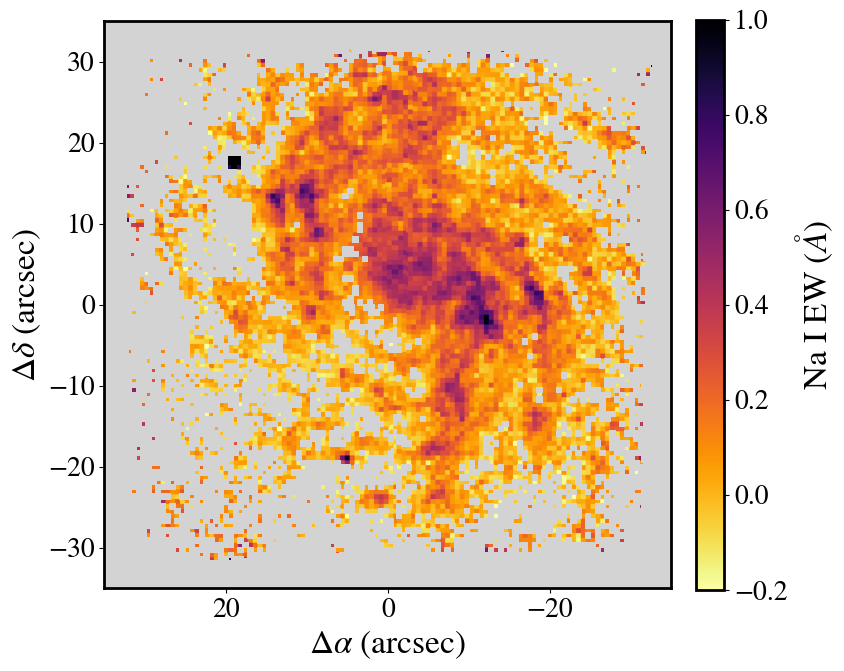

In [233]:
plt.rcParams['figure.figsize'] = (8,8)

ew_map_uncorr[(ew_map_uncorr==0)] = np.nan
ew_map_uncorr_filt = ew_map_uncorr[np.isfinite(ew_map_uncorr)==True]

fig, ax = plt.subplots()
img = ax.imshow(ew_map_uncorr,origin='lower',cmap='inferno_r',
           #norm=colors.LogNorm(vmin=1e-1, vmax=1e0,),
           vmin=-0.2,vmax=1,
          extent=[32.4, -32.6,-32.4, 32.6])

ax.set_facecolor('lightgrey')
ax.set_xlim(35,-35)
ax.set_ylim(-35,35)

ax.set_ylabel(r'$\Delta \delta$ (arcsec)',fontsize=24)
ax.set_xlabel(r'$\Delta \alpha$ (arcsec)',fontsize=24)
clb = fig.colorbar(img,fraction=0.046, pad=0.04);
clb.set_label(r'Na I EW ($\AA$)',fontsize=24)
clb.ax.set_yscale('linear')

plt.savefig('/Users/erickaguirre/Desktop/paper_plots/0.6_err_corr_plots/uncorr_ISM_NaI_EW_plot.pdf',
            bbox_inches='tight');

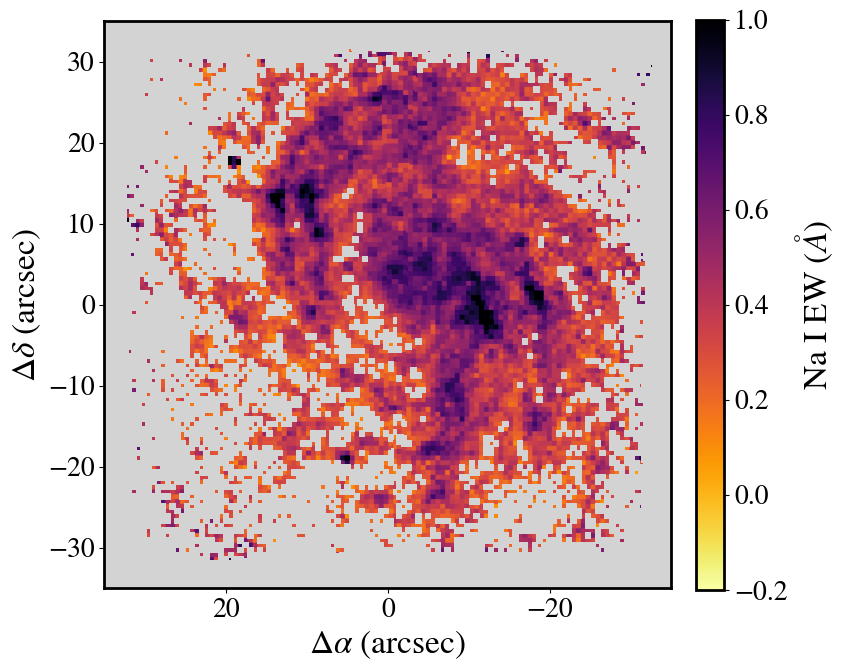

In [9]:
plt.rcParams['figure.figsize'] = (8,8)
#gas_vel_mask = ma.masked_where((vel_width_map>100) | (binid_map==-1), gas_vel_map)
#gas_vel_mask = ma.masked_where((gas_vel_mask>-400) & (gas_vel_mask < 400),gas_vel_mask)
ew_map_corr[(ew_map_corr<=0)] = np.nan
ew_map_corr_filt = ew_map_corr[np.isfinite(ew_map_corr)==True]

fig, ax = plt.subplots()
img = ax.imshow(ew_map_corr,origin='lower',cmap='inferno_r',
           #norm=colors.LogNorm(vmin=1e-1, vmax=1e0,),
           vmin=-0.2,vmax=1,
          extent=[32.4, -32.6,-32.4, 32.6])

ax.set_facecolor('lightgrey')
ax.set_xlim(35,-35)
ax.set_ylim(-35,35)

ax.set_ylabel(r'$\Delta \delta$ (arcsec)',fontsize=24)
ax.set_xlabel(r'$\Delta \alpha$ (arcsec)',fontsize=24)
clb = fig.colorbar(img,fraction=0.046, pad=0.04);
clb.set_label(r'Na I EW ($\AA$)',fontsize=24)
clb.ax.set_yscale('linear')

plt.savefig('/Users/erickaguirre/Desktop/paper_plots/0.6_err_corr_plots/corr_ISM_NaI_EW_plot_for_Kate.pdf',
            bbox_inches='tight');

In [5]:
# emission line header dictionary
emline = {}
for k, v in NGC4030_map['EMLINE_GFLUX'].header.items():
    if k[0] == 'C':
        try:
            i = int(k[1:])-1
        except ValueError:
            continue
        emline[v] = i
        
# H-alpha emission line flux from MUSE cube (1E-17 erg/s/cm^2/spaxel)
# 23rd index = 24 channel
halpha_map = NGC4030_map['EMLINE_GFLUX'].data[emline['Ha-6564'],:,:]
# H-beta emission line flux from MUSE cube
hbeta_map = NGC4030_map['EMLINE_GFLUX'].data[emline['Hb-4862'],:,:]

# #def get_SFR(halpha_map,hbeta_map,method,method2):
    
# #     if method == 'ccm':
# #     halpha and hbeta emissionlines sdss website 
# #     https://classic.sdss.org/dr7/products/spectra/vacwavelength.html
# # k_lambda_halpha = extinction.ccm89(np.array([6564.614]),a_v = 4.05, r_v = 3.1, unit='aa')
# # k_lambda_hbeta = extinction.ccm89(np.array([4862.721]),a_v = 4.05, r_v = 3.1, unit='aa')
# #     elif method == 'odonnell':
# # k_lambda_halpha = extinction.calzetti00(np.array([6564.614]),a_v = 4.05, r_v = 3.1, unit='aa')
# # k_lambda_hbeta = extinction.calzetti00(np.array([4862.721]),a_v = 4.05, r_v = 3.1, unit='aa')
# method = 'calzetti'
# if method == 'calzetti':
#     # extinction in magnitudes using Calzettie et al. 2000 extinction curve
#     k_lambda_halpha = extinction.calzetti00(np.array([6564.614]),a_v = 4.05, r_v = 3.1, unit='aa')
#     k_lambda_hbeta = extinction.calzetti00(np.array([4862.721]),a_v = 4.05, r_v = 3.1, unit='aa')
# #     elif method == 'fitzpatrick':
# #         k_lambda_halpha = extinction.fitzpatrick99(np.array([6564.614]),a_v = 4.05, r_v = 3.1, unit='aa')
# #         k_lambda_hbeta = extinction.fitzpatrick99(np.array([4862.721]),a_v = 4.05, r_v = 3.1, unit='aa')
# #     elif method == 'fitzpatrick_massa':
# #         # assuming r_v = 3.1
# #         k_lambda_halpha = extinction.fm07(np.array([6564.614]),a_v = 4.05, unit='aa')
# #         k_lambda_hbeta = extinction.fm07(np.array([4862.721]),a_v = 4.05, unit='aa')

#     #dust attenuation map
# # if method2 == 'method1':
# ebv_map = 0.935 * np.log( (halpha_map/hbeta_map) /2.86 )
# # elif method2 == 'method2':
# # ebv_map = (1.086/(k_lambda_hbeta - k_lambda_halpha) ) * np.log( (halpha_map/hbeta_map) /2.86 )
# # ebv_map = (2.5 /(k_lambda_hbeta - k_lambda_halpha) ) * np.log10( (halpha_map/hbeta_map) /2.86 )
# # any E(B-V) value less than 0 is unrealistic, and must be changed to 0
# ebv_map[ebv_map < 0] = 0.
#     # corrected h-alpha map 
# # halpha_map_corrected = halpha_map * (10**(0.4*k_lambda_halpha*ebv_map))
# halpha_map_corrected = halpha_map * (10**(0.4*k_lambda_halpha*ebv_map))
# # replace NaN values w/ finite values
# ebv_map[np.logical_not(np.isfinite(ebv_map))] = -999
# # use good values in original h-alpha map to replace NaN values
# # in corrected h-alpha map due to nan values from ebv map
# nan_indx = np.where(np.isfinite(halpha_map_corrected) == False)
# halpha_map_corrected[nan_indx] = halpha_map[nan_indx]

# # recessional velocity of NGC 4030 (SIMBAD value) (km/s)
# v_recess = 1467.2 * (u.kilometer / u.second)
# # Hubble constant (km/s/Mpc)
# H_0 = 70 * (u.kilometer / (u.second * 1e6 * u.parsec) )
# # NGC4030 distance
# #r = (v_recess / H_0).to(u.centimeter)
# r = (29.99 * 1e6 * u.parsec).to(u.centimeter)
# # h-alpha luminosity map (ergs/s)
# L_halpha = 4*np.pi * r**2 * halpha_map_corrected * ( (1e-17 * u.erg) / (u.second * u.centimeter**2) )
# # SFR map from h-alpha luminosity in units of M_sun / year
# #SFR_map = 7.94*10**(-42) * L_halpha * (u.second / u.erg) * (u.Msun / u.year)
# SFR_map = 10**(-41.27) * L_halpha * (u.second / u.erg) * (u.Msun / u.year)
#     #return np.sum( SFR_map.flatten() )

# logSFR_map = np.log10(L_halpha.value) - 41.27
# logSFR_map[np.logical_not(np.isfinite(logSFR_map))] = -999
# halpha_map_corrected[np.logical_not(np.isfinite(halpha_map_corrected))] = -999

# # SNR per spaxel and bin ID
# snr_spxl_map = NGC4030_map['SPX_SNR'].data
# snr_bin_map = NGC4030_map['BIN_SNR'].data
# obtain image data averaged around Na I region from MUSE cube
dc = cube.DataCube(inp=NGC4030_cube0_6_file)
n_band = transform.narrowband(dc, 5880, 5910, mode='median')
img_data = n_band.data

In [6]:
# --------------------------------------------------------------
# obtain gas velocities for spectral bin

# For continuum-normalization around NaI
# wavelength continuum fitting range outside of NaI region
blim = [5850.0,5870.0]
rlim = [5910.0,5930.0]
# wavelength fitting range inside of NaI region
fitlim = [5880.0,5910.0]
# speed of light in km/s
c = 2.998e5
# Na I doublet vacuum absorption wavelengths 
D2 = 5891.582 # in angstroms
D1 = 5897.558 # in angstroms

# sorting function
def sort_key(file_path):
    # individually splits the directory and filename from the path given
    dir_path, filename = os.path.split(file_path)

    # grab only run number from filename
    run = filename[-8:-4]

    # return only integer run number to sort
    num = int(''.join(i for i in run if i.isdigit()) )
    return run

# compile all the emcee fits and create a Na I velocity map
def mk_table_gasmap(path):

    # fits file path
    fits_paths = sorted(glob.glob(path+'*'), key = sort_key)

    # combine all the results from each fits file
    # done in MUSE analysis for one galaxy
    tables = []

    # rest wavelenth for Na I D2 absorption line
    lamrest = 5897.558 # in angstroms

    for fits_file in fits_paths:
        file = fits.open(fits_file)
        data_table = Table(file[1].data)
        data_table.remove_columns(['samples'])
        tables.append(data_table)

    table_all = vstack(tables)

    # get rid of duplicate bins in the table
    table_uniq = unique(table_all, keys=['bin'], keep='last')

    # creates a map that places the gas velocitiy values
    # to their respective bin_id pixel coordinates
    gas_vel_map = np.zeros(binid_map.shape)

    for binid in table_uniq['bin']:
        index = np.where(binid_map == binid)
        binid_indx = np.where(table_uniq['bin']== binid)
        gas_vel_map[index] = table_uniq['velocities'][binid_indx][0]

    # get the 84th and 16th percentile from the MCMC output pdf (probability density function)
    lambda_84th = table_uniq['percentiles'][:,0,1]+table_uniq['percentiles'][:,0,0]
    lambda_16th =  table_uniq['percentiles'][:,0,0]-table_uniq['percentiles'][:,0,2]
    
    vel_84th = (lambda_84th/lamrest - 1) * c
    vel_16th = (lambda_16th/lamrest - 1) * c
    
    table_uniq.add_column(vel_84th,name='vel_uncert_84th_percent')
    table_uniq.add_column(vel_16th,name='vel_uncert_16th_percent')

    return table_uniq, gas_vel_map

In [ ]:
# NGC4030 path
path = '/Users/erickaguirre/Desktop/NaI_MCMC_output/NGC4030_0.6_err_corr/'
table_uniq,gas_vel_map = mk_table_gasmap(path)

# create a fits file with the data
table_uniq.write('NGC4030_0.6_err_corr_mcmc_output.fits',format='fits',overwrite=True)
fits.append('NGC4030_0.6_err_corr_mcmc_output.fits', gas_vel_map)

In [7]:
# load the data
file = fits.open('NGC4030_0.6_err_corr_mcmc_output.fits')
table_all = Table(file[1].data)
gas_vel_map = file[2].data

# filter out bad values
table_good = table_all[table_all['velocities'] > -999]
# exclude velocities with high confidence interval widths
vel_widths = np.absolute(table_good['vel_uncert_84th_percent']-table_good['vel_uncert_16th_percent'])

vel_width_map = np.zeros(gas_vel_map.shape)
for binid in table_good['bin']:
    index = np.where(binid_map == binid)
    binid_indx = np.where(table_good['bin']== binid)
    vel_width_map[index] = vel_widths[binid_indx][0]
        
vel_widths_filt = vel_widths[vel_widths<100]
table_uniq = table_good[vel_widths<100]

In [119]:
table_uniq['velocities']

bin,percentiles,velocities,vel_uncert_84th_percent,vel_uncert_16th_percent
int32,"float64[4,3]",float64,float64,float64
0,5895.2547103368925 .. 0.10870928594702439,-117.09188943804372,-111.06409092849611,-122.41314284466831
1,5895.399517561064 .. 0.021930054745258498,-109.73067229179736,-107.28311921100007,-112.35398393017309
2,5895.443885637409 .. 0.029816585884295144,-107.47523893065491,-104.84336617595021,-109.83523121650147
3,5895.524712167729 .. 0.055490645425051,-103.36645468820728,-100.57170002241071,-106.18545609437004
4,5895.765311203581 .. 0.01950143192652376,-91.13569922546245,-88.73208283710127,-93.7768052353572
5,5895.704257686598 .. 0.03783524320854259,-94.23933026755391,-91.29698631395573,-97.11541595854271
6,5895.732180743371 .. 0.013314921838519844,-92.81987287881172,-88.70594666486062,-96.94912537049643
7,5895.463568365315 .. 0.010856781710144675,-106.47467535397371,-101.68525525706849,-111.7020541298279
8,5895.238273871964 .. 0.018906155157904753,-117.92743053861213,-113.63871313138193,-122.93153240545924


In [6]:
def get_ew_from_percentiles(binid,binid_map, stellar_vel,redshift, obswave, LSFvel):
    ind = binid_map == binid
    # single bin velocity

    binvel = stellar_vel[ind][0]
#     # single flux, error and model spectrum corresponding to that bin
#     flux_bin = np.ma.array(flux[:, ind][:, 0])
#     err_bin = np.ma.array(error[:, ind][:, 0])
#     mod_bin = np.ma.array(model[:, ind][:, 0])

    # Determine bin redshift:
    c = 2.998e5
    bin_z = redshift + ((1 + redshift) * binvel / c)
    restwave = obswave / (1.0 + bin_z)

    binid_indx = table_uniq['bin'] == binid
    model_fit_bin = model_NaI.model_NaI(table_uniq['percentiles'][binid_indx][0][:, 0], LSFvel, restwave)
    
    # Focus on D2 component(5891 angstrom)
    fitlim = [5887, 5894]
    D2_flux = model_fit_bin['modflx'][(restwave > fitlim[0]) & (restwave < fitlim[1])]
    
    delta_lam = restwave[1] - restwave[0]
    ew = np.sum( (1 - (D2_flux / 1) ) * delta_lam ) # flux is already normalized so continuum=1

    return ew

def get_ew_map(binid_map, redshift, stellar_vel, obswave,LSFvel):

    # create ew map
    ew_map = np.zeros(binid_map.shape)

    for binid in range(np.max(binid_map)):

        ew = get_ew_from_percentiles(int(binid),binid_map, redshift, stellar_vel, obswave, LSFvel)
        ind = binid_map == binid
        ew_map[ind] = ew

    return ew_map

In [ ]:
plt.rcParams['figure.figsize'] = (20,20) 
fig = plt.figure()
gs = fig.add_gridspec(2, 2, hspace=-0.2, wspace=.4)
(ax1, ax2), (ax3, ax4) = gs.subplots()

# fig, ((ax1, ax2),(ax3,ax4)) = plt.subplots(2, 2,sharey=True,sharex=True,squeeze=True,hspace=0)
# fig.tight_layout(pad=0.1)

# set the tick range for each image
tick_range = np.arange(-30,40,10)

# Median Na I flux map
NaI_img = ax1.imshow(img_data,origin='lower',cmap='gray_r',vmin = 0,vmax=.8,
          extent=[32.4, -32.6,-32.4, 32.6])

ax1.set_xticks(tick_range,labels=tick_range,fontsize=30)
ax1.set_yticks(tick_range,labels=tick_range,fontsize=30)
ax1.set_xlim(35,-35)
ax1.set_ylim(-35,35)

ax1.set_ylabel(r'$\Delta \delta$ (arcsec)',fontsize=40)
#ax1.set_xlabel(r'$\Delta \alpha$ (arcsec)',fontsize=24)

NaI_clb = fig.colorbar(NaI_img, ax=ax1,fraction=0.046, pad=0.04)
NaI_clb.ax.tick_params(labelsize=30)
# NaI_clb.set_label(r'Na I Flux (10$^{-20}$ erg$^{-1}$ cm$^{-2}$ s$^{-1}$)',fontsize=20,rotation = 90,
#                  labelpad = 4)
ax1.text(-54,-10,r'Na I Flux',rotation=90,fontsize=35)
# ax1.text(-50,-30.5,r'Na I Flux (10$^{-20}$ erg$^{-1}$ cm$^{-2}$ s$^{-1}$)',rotation=90,fontsize=28)

sfr = ax2.imshow(halpha_map,origin='lower',cmap='viridis', norm=colors.LogNorm(vmin=.1,vmax=10),
          extent=[32.4, -32.6,-32.4, 32.6])

ax2.set_xticks(tick_range,labels=tick_range,fontsize=30)
ax2.set_yticks(tick_range,labels=tick_range,fontsize=30)
ax2.set_xlim(35,-35)
ax2.set_ylim(-35,35)
sfr_clb = fig.colorbar(sfr, ax=ax2,fraction=0.046, pad=0.04) 
sfr_clb.ax.tick_params(labelsize=30)
# sfr_clb.set_label(r'H$\alpha$ Flux (10$^{-20}$ erg$^{-1}$ cm$^{-2}$ s$^{-1}$)',fontsize=20,rotation = 90)
# ax2.text(-50,-29,r'H$\alpha$ Flux (10$^{-20}$ erg$^{-1}$ cm$^{-2}$ s$^{-1}$)',rotation=90,fontsize=28)
ax2.text(-54,-10,r'H$\alpha$ Flux',rotation=90,fontsize=35)

stell_vel = ax3.imshow(stellar_vel,origin='lower',cmap='coolwarm',vmin=-150,vmax=150,
          extent=[32.4, -32.6,-32.4, 32.6])

ax3.set_xticks(tick_range,labels=tick_range,fontsize=30)
ax3.set_yticks(tick_range,labels=tick_range,fontsize=30)
ax3.set_xlim(35,-35)
ax3.set_ylim(-35,35)
ax3.set_ylabel(r'$\Delta \delta$ (arcsec)',fontsize=40)

ax3.set_xlabel(r'$\Delta \alpha$ (arcsec)',fontsize=40)
stell_clb = fig.colorbar(stell_vel, ax =ax3, fraction=0.046, pad=0.04);
stell_clb.ax.tick_params(labelsize=30)
# stell_clb.set_label('Stellar Velocity (km/s)',fontsize=24,rotation = 90)
ax3.text(-54,-27,r'Stellar Velocity (km s$^{-1}$)',rotation=90,fontsize=35)

chi2_map = NGC4030_map['STELLAR_FOM'].data[2]
#norm=colors.LogNorm(vmin=.1,vmax=10)
#vmin=0,vmax=1.5
chi_sqr = ax4.imshow(chi2_map,origin='lower',cmap='bone_r',vmin=.5,vmax=1.5,
          extent=[32.4, -32.6,-32.4, 32.6])

ax4.set_xticks(tick_range,labels=tick_range,fontsize=30)
ax4.set_yticks(tick_range,labels=tick_range,fontsize=30)
ax4.set_xlim(35,-35)
ax4.set_ylim(-35,35)
#ax4.set_ylabel(r'$\Delta \delta$ (arcsec)',fontsize=24)
#ax4.ylabel(r'$\Delta \delta$ (arcsec)',fontsize=24)
ax4.set_xlabel(r'$\Delta \alpha$ (arcsec)',fontsize=40)
chi2_clb = fig.colorbar(chi_sqr, ax = ax4, fraction=0.046, pad=0.04)
chi2_clb.ax.tick_params(labelsize=30)
# chi2_clb.set_label(r'$\chi^2$',fontsize=24,rotation = 90,labelpad=.1)
ax4.text(-54,0,r'$\chi^2$',rotation=90,fontsize=35);
fig.savefig('/Users/erickaguirre/Desktop/paper_plots/0.6_err_corr_plots/0.6_DAP_output.pdf',
           bbox_inches='tight');

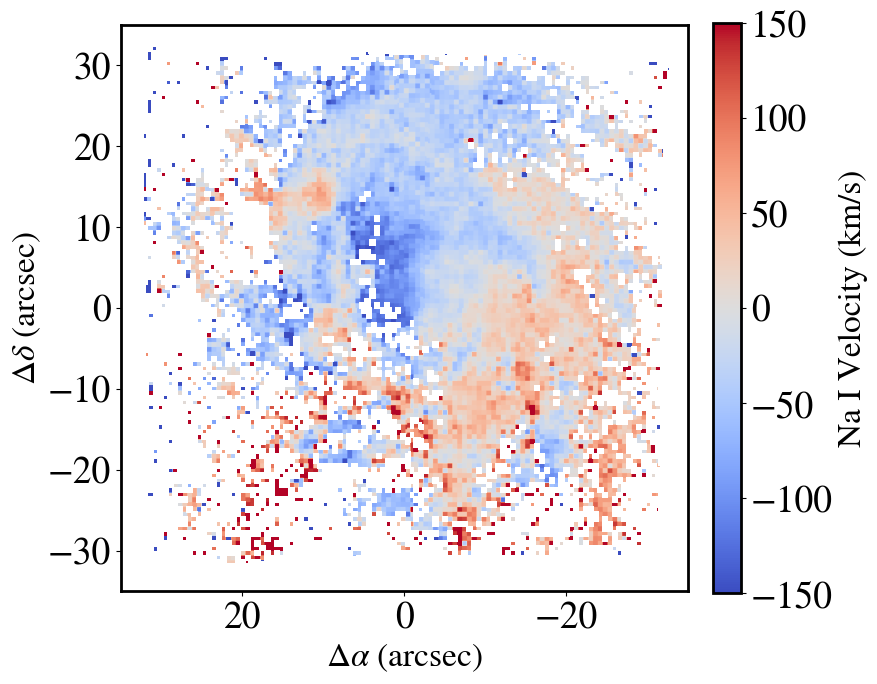

In [14]:
plt.rcParams['figure.figsize'] = (8,8)
gas_vel_mask = ma.masked_where((vel_width_map>100) | (binid_map==-1), gas_vel_map)
#gas_vel_mask = ma.masked_where((gas_vel_mask>-400) & (gas_vel_mask < 400),gas_vel_mask)
plt.imshow(gas_vel_mask,origin='lower',cmap='coolwarm',vmin=-150,vmax=150,
          extent=[32.4, -32.6,-32.4, 32.6])

plt.xlim(35,-35)
plt.ylim(-35,35)

plt.ylabel(r'$\Delta \delta$ (arcsec)',fontsize=24)
plt.xlabel(r'$\Delta \alpha$ (arcsec)',fontsize=24)
clb = plt.colorbar(fraction=0.046, pad=0.04);
clb.set_label('Na I Velocity (km/s)',fontsize=24,rotation = 90)
plt.savefig('/Users/erickaguirre/Desktop/paper_plots/0.6_err_corr_plots/NaI_velocities.pdf',
            bbox_inches='tight');

In [8]:
def calc_ew(restwave, restvel, gas_flux ,gas_err, SN, D1_velocity):
    #(data,vel_centroid):

    # speed of light in km/s
    c = 2.998e5
    # Na I doublet vacuum absorption wavelengths 
    D2 = 5891.582 # in angstroms
    D1 = 5897.558 # in angstroms
    
    # calculate shift in velocity from red D1 centroid to blue D2 centroid
    shift_v = (D2/D1 - 1) * c
    
    # velocity centroid for D2 line
    D2_velocity = D1_velocity + shift_v

    # Focus on D2 component(5891.582 angstrom)
    fitlim = [D2_velocity-100, D2_velocity+100]

    # limit gas flux to values between limits provided
    gas_flux_cut = gas_flux[(restvel > fitlim[0]) & (restvel < fitlim[1])]
    gas_err_cut = gas_err[(restvel > fitlim[0]) & (restvel < fitlim[1])]
    
    delta_lamb = restwave[1] - restwave[0]
    
    # calculate ew from gas residual flux
    ew = (1 - (gas_flux_cut / 1) ) * delta_lamb # flux is already normalized so continuum=1
    ew_tot = np.sum(ew)
        
    # Method 1
    # equivalent width (EW) error equation from K.Vollmann and T.Eversberg (2006)
    # EW error per pixel
    ew_err1 =  np.sqrt(2) * ( (delta_lamb - ew) / SN)
    # total EW error
    ew_err_tot1 = np.sqrt( np.sum(ew_err1**2) )
    
    # Method 2
    # EW error using error of propagation and excluding continuum portion (sigma_continuum)
    ew_err2 = (delta_lamb/1) *  gas_err
    ew_err_tot2 = np.sqrt( np.sum(ew_err2**2) )
    
    return ew_tot, ew_err_tot1, ew_err_tot2, fitlim

In [9]:
def NaImcmc(table,binid, redshift, binid_map, stellar_vel, 
            flux, model, error, obswave, LSFvel,vel_widths_filt):
    ind = binid_map == binid
    # single bin velocity
    binvel = stellar_vel[ind][0]
    # single flux, error and model spectrum corresponding to that bin
    flux_bin = np.ma.array(flux[:, ind][:, 0])
    err_bin = np.ma.array(error[:, ind][:, 0])
    mod_bin = np.ma.array(model[:, ind][:, 0])
    
    # speed of light in km/s
    c = 2.998e5
    # Na I doublet vacuum absorption wavelengths 
    D2 = 5891.582 # in angstroms
    D1 = 5897.558 # in angstroms
    blim = [5850.0,5870.0]
    rlim = [5910.0,5930.0]
    # wavelength fitting range inside of NaI region
    fitlim = [5875.0,5915.0]

    # Determine bin redshift:
    bin_z = redshift + ((1 + redshift) * binvel / c)
    restwave = obswave / (1.0 + bin_z)
    # convert wavelength array from angstroms to velocity space
    vel_space = ( (restwave/D1) - 1 ) * c
    
#     # observed flux (gas+continuum model)
#     tot_ndata = continuum_normalize_NaI.norm(restwave, mod_bin, err_bin, blim, rlim, FIT_FLG=1,smod=flux_bin)
#     # stellar continuum model
#     mod_ndata = continuum_normalize_NaI.norm(restwave, mod_bin, err_bin, blim, rlim, FIT_FLG=0)
#     # gas flux (total flux / stellar continuum)
#     gas_ndata = continuum_normalize_NaI.smod_norm(restwave, flux_bin, err_bin, mod_bin, blim, rlim)
    
    # observed flux (gas+continuum model)
    tot_ndata = continuum_normalize_NaI.norm(restwave, flux_bin, err_bin, blim, rlim, FIT_FLG=0)
    # stellar continuum model
    mod_ndata = continuum_normalize_NaI.norm(restwave, flux_bin, err_bin, blim, rlim, FIT_FLG=1,smod=mod_bin)
    # gas flux (total flux / stellar continuum)
    gas_ndata = continuum_normalize_NaI.smod_norm(restwave, flux_bin, err_bin, mod_bin, blim, rlim)

    # Cut out NaI
    select_obs = np.where((tot_ndata['nwave'] > fitlim[0]) & (tot_ndata['nwave'] < fitlim[1]))
    select_mod = np.where((mod_ndata['nwave'] > fitlim[0]) & (mod_ndata['nwave'] < fitlim[1]))
    select_gas = np.where((gas_ndata['nwave'] > fitlim[0]) & (gas_ndata['nwave'] < fitlim[1]))

    restwave_NaI = tot_ndata['nwave'][select_obs].astype('float64')
    rest_vel = vel_space[select_obs].astype('float64')
    obsflux_NaI = tot_ndata['nflux'][select_obs].astype('float64')
    err_NaI = tot_ndata['nerr'][select_obs].astype('float64')
    sres_NaI = LSFvel
    mod_NaI = mod_ndata['nflux'][select_mod].astype('float64')
    gas_NaI = gas_ndata['nflux'][select_gas].astype('float64')
    gas_NaI_err = gas_ndata['nerr'][select_gas].astype('float64')
    
    data = {'wave': restwave_NaI, 'rest_vel': rest_vel,'tot_flux': obsflux_NaI,'tot_err':err_NaI,
            'model': mod_NaI, 'gas_flux': gas_NaI,'gas_err': gas_NaI_err, 'velres': sres_NaI,
            'S_N':tot_ndata['s2n'],
           }
    
    binid_indx = table['bin'] == binid
    model_fit_bin = model_NaI.model_NaI(table['percentiles'][binid_indx][0][:, 0], 
                                        data['velres'], data['wave'])
    lamb_centroid = table['percentiles'][binid_indx][0][0,0]
    vel_centroid = ( (lamb_centroid/D1) - 1) * c
    vel_vals =np.array([vel_centroid,table['vel_uncert_84th_percent'][binid_indx][0],
                        table['vel_uncert_16th_percent'][binid_indx][0]])
    bin_vel_width = vel_widths_filt[binid_indx]
    
    ew, ew_err1, ew_err2, D2_fitlims = calc_ew(data['wave'],data['rest_vel'],data['gas_flux'],data['gas_err'],
                                     gas_ndata['s2n'],vel_centroid)
    
    # ew from the gas residual flux at the D2 line
    data['EW'] = ew
    data['EW_sigma1'] = ew_err1
    data['EW_sigma2'] = ew_err2
    data['D2_fitlims'] = D2_fitlims
    
#     lamb_stats = table['percentiles'][binid_indx][0][0,:]
#     lamb_84 = lamb_stats[1] + lamb_stats[0]
#     lamb_16 = lamb_stats[0] - lamb_stats[2]
#     lamb_vals = np.array([lamb_stats[0],lamb_84,lamb_16])
#     vel_vals = ( (lamb_vals/D2) - 1) * c
#     vel_upper_uncert = np.absolute(vel_vals[1] - vel_vals[0])
#     vel_lower_uncert = np.absolute(vel_vals[0]-vel_vals[2])
#     vel_stats = np.array([vel_vals[0],vel_upper_uncert,vel_lower_uncert])
    return data,model_fit_bin,vel_vals,bin_vel_width[0]

/Users/erickaguirre/miniconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/erickaguirre/packages/linetools/linetools/spectra/xspectrum1d.py:107: UserWarning: Assuming wavelength unit is Angstroms
  warnings.warn("Assuming wavelength unit is Angstroms")


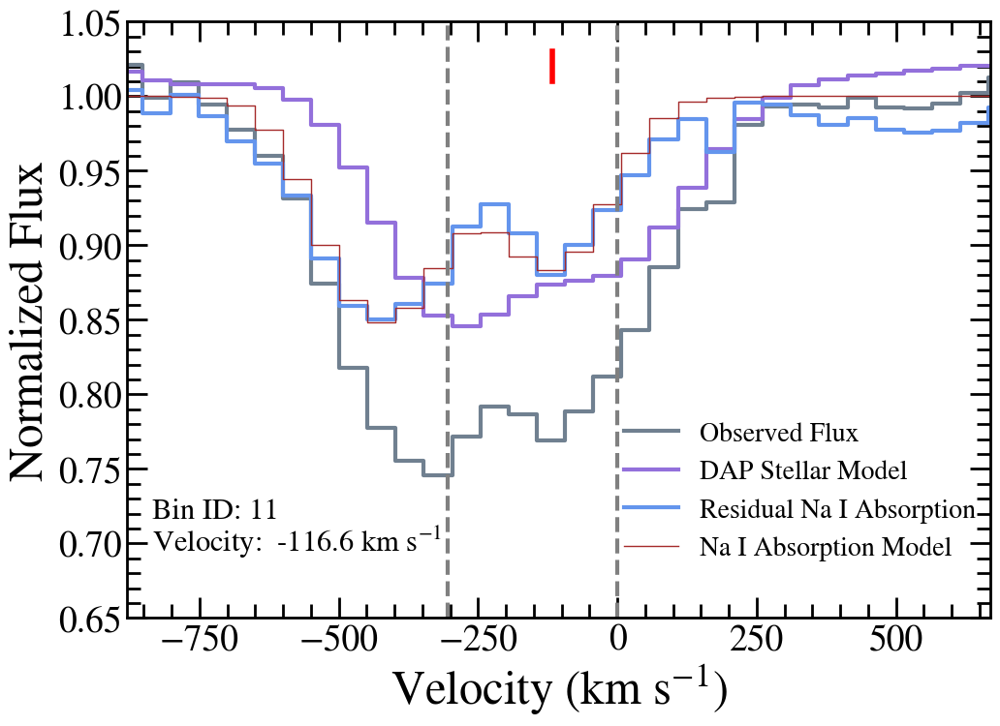

In [9]:
# get data around Na I region and the best-fit model to it
binid = 11
data_NaI, model_fit_bin_NaI,vel_vals,bin_vel_width = NaImcmc(table_uniq,binid, redshift, binid_map, 
                                                   stellar_vel, flux, model,error, wave,LSFvel,vel_widths_filt)

plt.rcParams['figure.figsize'] = (11.5,8)
plt.rc('xtick',labelsize=27)
plt.rc('ytick',labelsize=27)
fig, ax = plt.subplots()

ax.step(data_NaI['rest_vel'],data_NaI['tot_flux'],lw=3,label='Observed Flux',c='slategrey',where='mid')
ax.step(data_NaI['rest_vel'],data_NaI['model'],lw=3,label='DAP Stellar Model',c='mediumpurple',where='mid')
ax.step(data_NaI['rest_vel'],data_NaI['gas_flux'],lw=3,label='Residual Na I Absorption',c='cornflowerblue',
        where='mid')
ax.step(data_NaI['rest_vel'],model_fit_bin_NaI['modflx'],lw=1,label='Na I Absorption Model',c='brown',
        where='mid')

ax.axvline(0,c='grey',ls='--',lw=3)
ax.axvline( ( (D2/D1) - 1) * c ,c='grey',ls='--',lw=3)
ax.axvline(vel_vals[0], 0.9, 0.95, c='red',linewidth=4)
#ax.axhline( 1,c='grey',ls='--',lw=1)


ax.xaxis.set_minor_locator(AutoMinorLocator())
ax.yaxis.set_minor_locator(AutoMinorLocator())
ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                    length=15,width=2)
ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                    length=10,width=2)

bin_txt = 'Bin ID: ' + str(binid)
vel50_txt = 'Velocity:  {:.1f}'.format(vel_vals[0]) + r' km s$^{-1}$'
# vel84_txt = '84th%: {:.1f}'.format(vel_vals[1])
# vel16_txt = '16th%: {:.1f}'.format(vel_vals[2])
# vel_width_txt = 'Delta V: {:.1f}'.format(bin_vel_width)

ax.annotate(bin_txt,(-835,0.717),fontsize=22)
ax.annotate(vel50_txt,(-835,0.695),fontsize=22)
# ax.annotate(vel84_txt,(-820,0.695),fontsize=16)
# ax.annotate(vel16_txt,(-820,0.68),fontsize=16)
# ax.annotate(vel_width_txt,(-820,0.665),fontsize=16)

ax.set_ylabel('Normalized Flux',fontsize=35)
ax.set_xlabel(r'Velocity (km s$^{-1}$)',fontsize=35)
ax.set_xlim(-880,670)
ax.set_ylim(0.65,1.05)
ax.legend(frameon=False,loc='best',bbox_to_anchor=(0.548, .37),fontsize=20);
plt.savefig('/Users/erickaguirre/Desktop/paper_plots/0.6_err_corr_plots/NaI_spectrum.pdf',bbox_inches='tight');

In [10]:
def get_pix_coords(bin_ids,binid_map):
    x_pixels = []
    y_pixels = []

    for bin_ in bin_ids:
        bin_id = np.where(binid_map == bin_)
        x_pixels.append(bin_id[1][0])
        y_pixels.append(bin_id[0][0])
        
    return x_pixels,y_pixels

def get_derived_vals(table, binid):
    binid_indx = np.where(table['bin']== binid)
    percentiles = table['percentiles'][binid_indx][0]

    lambda_r = percentiles[0]
    N = percentiles[1]
    b_d = percentiles[2]
    C_f = percentiles[3]
    
    return lambda_r, N,b_d,C_f

def get_ew_sn(table,binid_range, redshift, binid_map, stellar_vel, flux, model,error, wave,LSFvel,
                    vel_widths_filt):
    bin_ids = []
    gas_velocities = []
    bin_vel_widths = []
    sn_bins = []
    ews = []
    ews_sig1 = []
    ews_sig2 = []
    logNs = []
    logNs_lower_err = []
    logNs_upper_err = []
    b_ds = []
    b_ds_lower_err = []
    b_ds_upper_err = []
    C_fs = []
    C_fs_lower_err = []
    C_fs_upper_err = []
    
    for binid in binid_range:
        data_NaI, model_fit_bin_NaI,vel_vals,bin_vel_width = NaImcmc(table,binid, redshift, binid_map, 
                                                           stellar_vel, flux, model,error, wave,LSFvel,
                                                            vel_widths_filt)
        
        bin_ids.append(binid)
        gas_velocities.append(vel_vals[0])
        bin_vel_widths.append(bin_vel_width)
        sn_bins.append(data_NaI['S_N'])
        ews.append(data_NaI['EW'])
        ews_sig1.append(data_NaI['EW_sigma1'])
        ews_sig2.append(data_NaI['EW_sigma2'])
        
        lambda_r, N,b_d,C_f = get_derived_vals(table, binid)
        
        logNs.append(N[0])
        logNs_lower_err.append(N[1])
        logNs_upper_err.append(N[2])
    
        b_ds.append(b_d[0])
        b_ds_lower_err.append(b_d[1])
        b_ds_upper_err.append(b_d[2])

        C_fs.append(C_f[0])
        C_fs_lower_err.append(C_f[1])
        C_fs_upper_err.append(C_f[2])

    
    table_vals = Table([bin_ids,gas_velocities,bin_vel_widths,sn_bins,ews,ews_sig1,ews_sig2,
                        logNs,logNs_lower_err,logNs_upper_err,
                        b_ds,b_ds_lower_err,b_ds_upper_err,
                        C_fs,C_fs_lower_err,C_fs_upper_err], 
                       names=('bin_id','gas_vel','vel_widths','sn_bin','ews','ews_sig1','ews_sig2',
                              'logN','logNs_lower_err','logNs_upper_err',
                              'b_d','b_ds_lower_err','b_ds_upper_err',
                              'C_f','C_fs_lower_err','C_fs_upper_err'))
    
    return table_vals

In [11]:
def mkplots(table_uniq,binid_range,redshift, binid_map, stellar_vel, flux, model,error, 
            wave,LSFvel,vel_widths_filt,file_name):

    plt.rcParams['figure.figsize'] = (20,20)
    fig,((ax1,ax2,ax3,ax4,ax5), \
         (ax6,ax7,ax8,ax9,ax10),\
         (ax11, ax12,ax13,ax14,ax15), \
         (ax16,ax17,ax18,ax19,ax20), \
        (ax21, ax22,ax23,ax24,ax25)) =plt.subplots(5,5)
    # speed of light in km/s
    c = 2.998e5
    # Na I doublet vacuum absorption wavelengths 
    D2 = 5891.582 # in angstroms
    D1 = 5897.558 # in angstroms
    
    
    for ax,binid in zip(fig.get_axes(),binid_range):
        data_NaI, model_fit_bin_NaI,vel_vals,bin_vel_width = NaImcmc(table_uniq,binid, redshift, binid_map, 
                                                           stellar_vel, flux, model,error, wave,LSFvel,
                                                            vel_widths_filt)

        ax.step(data_NaI['rest_vel'],data_NaI['tot_flux'],
                lw=3,label='Total Gas Flux',c='slategrey',where='mid')
        ax.step(data_NaI['rest_vel'],data_NaI['model'],
                lw=3,label='DAP Model',c='mediumpurple',where='mid')
        ax.step(data_NaI['rest_vel'],data_NaI['gas_flux'],
                lw=3,label='Gas Flux',c='cornflowerblue',where='mid')
        ax.step(data_NaI['rest_vel'],model_fit_bin_NaI['modflx'],
                lw=1,label='Gas Model',c='brown',where='mid')

        ax.axvline(0,c='grey',ls='--',lw=2)
        ax.axvline(vel_vals[0],lw=2, c='red',linewidth=2)
        ax.axvline(data_NaI['D2_fitlims'][0],lw=1, c='k',linewidth=2)
        ax.axvline(data_NaI['D2_fitlims'][1],lw=1, c='k',linewidth=2)
        
        ax.xaxis.set_minor_locator(AutoMinorLocator())
        ax.yaxis.set_minor_locator(AutoMinorLocator())
        ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                            length=10,width=2)
        ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                            length=5,width=2)

        spx_id = np.where(binid_map == binid)
        title_txt='[x,y]: ['+str(spx_id[1][0])+','+str(spx_id[0][0])+'] '+'ID: ' + str(binid) 
        ax.set_title(title_txt)
        
        vel50_txt = 'Velocity: {:.1f}'.format(vel_vals[0])
        vel84_txt = '84th%: {:.1f}'.format(vel_vals[1])
        vel16_txt = '16th%: {:.1f}'.format(vel_vals[2])
        vel_width_txt = r'$\Delta$V: {:.1f}'.format(bin_vel_width)
        S_N_txt = 'S/N: {:.1f}'.format(data_NaI['S_N'])
        EW_txt = 'EW: {:.2f}'.format(data_NaI['EW'])
        
        ax.annotate(EW_txt,(-820,0.735),fontsize=14)
        ax.annotate(S_N_txt,(-820,0.705),fontsize=14)
        ax.annotate(vel50_txt,(-820,0.67),fontsize=14)
        ax.annotate(vel84_txt,(-820,0.635),fontsize=14)
        ax.annotate(vel16_txt,(-820,0.605),fontsize=14)
        ax.annotate(vel_width_txt,(-820,0.575),fontsize=14)
        
        ax.set_ylabel('Normalized Flux',fontsize=15)
        ax.set_xlabel(r'Velocity (km s$^{-1}$)',fontsize=15)
        ax.set_xlim(-875,600)
        ax.set_ylim(0.55,1.15)
        #ax.legend(fontsize='x-small',frameon=False,loc='lower right');

#     ax4.legend(fontsize='x-large',bbox_to_anchor=(1, .94))
#     ax1.set_ylabel('Flux (Normalized)')
#     ax5.set_ylabel('Flux (Normalized)')
#     ax5.set_xlabel('Velocity (km/s)')
#     ax6.set_xlabel('Velocity (km/s)')
#     ax7.set_xlabel('Velocity (km/s)')
#     ax8.set_xlabel('Velocity (km/s)')
    fig.tight_layout()
    plt.savefig('/Users/erickaguirre/Desktop/paper_plots/0.6_err_corr_plots/' + \
                 file_name +'.png');

In [25]:
table_compare = get_ew_sn(table_uniq,table_uniq['bin'], redshift, binid_map, stellar_vel, 
                          flux, model,error, wave,LSFvel,vel_widths_filt)

/Users/erickaguirre/miniconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/erickaguirre/packages/linetools/linetools/spectra/xspectrum1d.py:107: UserWarning: Assuming wavelength unit is Angstroms
  warnings.warn("Assuming wavelength unit is Angstroms")


In [26]:
# add pixel coordinates to Table
x_pixels,y_pixels = get_pix_coords(table_compare['bin_id'],binid_map)
table_compare['x'],table_compare['y'] = np.array(x_pixels),np.array(y_pixels)

gas_mask = gas_vel_mask.mask
gas_vel_map_nan = gas_vel_mask.data
gas_vel_map_nan[gas_mask==True] = np.nan

# create a fits file with the ew and delta V data
#table_compare.write('NGC4030_0.6_deltaV_ew_output.fits',format='fits',overwrite=True)
table_compare.write('NGC4030_0.6_deltaV_ew_output.fits', overwrite=True)
#fits.append('NGC4030_0.6_deltaV_ew_output.fits', gas_vel_map_nan)
#Open an existing FITS file in update mode
with fits.open('NGC4030_0.6_deltaV_ew_output.fits', mode='update') as hdul:
    # Create an extension HDU with a specified name
    extension_hdu = fits.ImageHDU(gas_vel_map_nan, name='GAS_VELOCITY_MAP')
    # Append the extension HDU to the existing HDU list
    hdul.append(extension_hdu)
    # Write the changes to the FITS file
    hdul.flush()

In [29]:
table_compare

bin_id,gas_vel,vel_widths,sn_bin,ews,ews_sig1,ews_sig2,logN,logNs_lower_err,logNs_upper_err,b_d,b_ds_lower_err,b_ds_upper_err,C_f,C_fs_lower_err,C_fs_upper_err,x,y
int32,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64
0,-117.08680796349054,11.3490519161722,139.0205535888672,0.37364156046533026,0.018300543527894442,0.04753260209711457,13.014951924355563,0.279019277579323,0.4045131824969932,80.11325387602885,9.030629143409882,10.737783427166136,0.30586129958501374,0.3602079938959101,0.10870928594702439,160,162
1,-109.72559069242736,5.0708647191730165,161.53591918945312,0.4753111875616014,0.015298253607826844,0.0415713991110354,13.380149172720733,0.08346698199265035,0.08727708004395751,51.03814334096507,5.522828247642714,5.852292760663595,0.24965464520197864,0.027922482666816822,0.021930054745258498,159,165
2,-107.47015729304104,4.991865040551261,147.28079223632812,0.5086757385288365,0.01662593958140632,0.045261139501549315,13.288252197998855,0.09718306867802973,0.11611115215264078,43.69044957178685,5.00267592151237,6.198314896679378,0.29869119095389085,0.044051892523209346,0.029816585884295144,159,168
3,-103.36137298092898,5.61375607195933,142.77268981933594,0.6246936483366881,0.016577197868958858,0.04581732888759755,13.200487337006127,0.1174657914255981,0.12232582948254134,76.1987068826604,5.207593545035223,6.079369766148616,0.3608765178270571,0.07869954226659837,0.055490645425051,159,171
4,-91.13061731082179,5.044722398255928,129.67520141601562,0.7090488602989353,0.017808824040696784,0.05198591122810848,13.511653030754804,0.07024354828433488,0.07421377803924223,71.9841051803327,4.279115977941785,3.792183249494201,0.28813723752068615,0.023384310229285166,0.01950143192652376,159,174
5,-94.23424840550274,5.818429644586985,124.67562866210938,0.7889763158163987,0.01806493127100879,0.05264746582596546,13.364579250563194,0.08173513348505956,0.07683262327819307,96.2341092382481,2.6578240769910053,4.048206675632613,0.36249894905017654,0.04557425560414308,0.03783524320854259,159,177
6,-92.81479099269588,8.243178705635813,117.45394897460938,0.6704476202430669,0.019874100558337163,0.055180611115100024,13.684129287289764,0.06366092206365082,0.06094337235328595,97.9316987595166,1.485980074005596,2.8315195326003675,0.22113114865078276,0.014575005219974069,0.013314921838519844,159,180
7,-106.46959369938473,10.01679887275941,103.79444885253906,0.68748927192064,0.02236862145246411,0.06250688028242664,13.854720801327684,0.07570445427624861,0.06399475350284511,98.73837476363451,0.9226462653561072,2.294839794611434,0.19885608654188813,0.011515278396590972,0.010856781710144675,159,183
8,-117.92234907823813,9.292819274077303,101.48898315429688,0.6482008962775581,0.02316763065516692,0.06607337646174107,13.64997588287691,0.09857417820784597,0.08073513827493883,91.19669514931198,5.789639445604408,7.479669397400613,0.2220585959597337,0.020802583297862637,0.018906155157904753,159,186


# data points: 1178
# data points: 3844
# data points: 1609
# data points: 276


In [45]:

tooltips

[('Vel', '@gas_vel{000.0}'),
 ('S/N', '@sn_bin{000.0}'),
 ('EW', '@ews{0.00}'),
 ('b_d', '@b_d{000.0}'),
 ('C_f', '@C_f{0.0}'),
 ('Bin ID', '@bin_id'),
 ('(x,y)', '[@x,@y]')]

In [33]:
hdu = fits.open('NGC4030_0.6_deltaV_ew_output.fits')
hdu.info()

Filename: NGC4030_0.6_deltaV_ew_output.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU       4   ()      
  1                1 BinTableHDU     44   6909R x 18C   [J, D, D, D, D, D, D, D, D, D, D, D, D, D, D, D, K, K]   
  2  GAS_VELOCITY_MAP    1 ImageHDU         8   (326, 326)   float64   


In [14]:
ew_bin1 = np.where((table_compare['ews']>0) & (table_compare['ews']<0.25))
ew_bin2 = np.where((table_compare['ews']>0.25) & (table_compare['ews']<0.5))
ew_bin3 = np.where((table_compare['ews']>0.5) & (table_compare['ews']<0.75))
ew_bin4 = np.where((table_compare['ews']>0.75))

#t_ew0 = table_compare[ew_bin0]
t_ew1 = table_compare[ew_bin1]
t_ew2 = table_compare[ew_bin2]
t_ew3 = table_compare[ew_bin3]
t_ew4 = table_compare[ew_bin4]

print(len(t_ew1))
print(len(t_ew2))
print(len(t_ew3))
print(len(t_ew4))
print(len(table_compare))

1178
3844
1609
276
6909


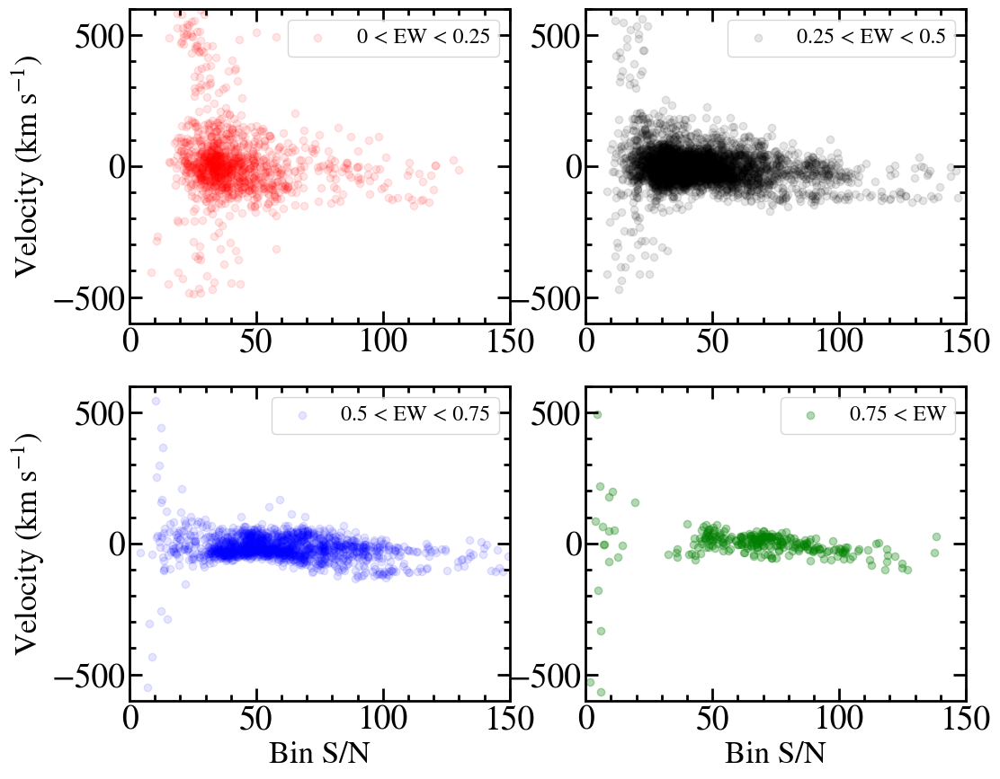

In [90]:
plt.rcParams['figure.figsize'] = (12,10)
fig,((ax1,ax2),
     (ax3,ax4)) =plt.subplots(2,2)

t_ews = [t_ew1,t_ew2,t_ew3,t_ew4]
colors = ['r','k','blue','green']
labels = ['0 < EW < 0.25','0.25 < EW < 0.5','0.5 < EW < 0.75','0.75 < EW']
alpha_val = 0.1
for ax,t_ew,color,label_txt in zip(fig.get_axes(),t_ews,colors,labels):
    
    if label_txt == '0.75 < EW':
        alpha_val = 0.3
        
    ax.scatter(t_ew['sn_bin'],t_ew['gas_vel'],alpha=alpha_val,c=color,label=label_txt) 
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                        length=10,width=2)
    ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                        length=5,width=2)
    ax.set_xlim(0,150)
    ax.set_ylim(-600,600)
    ax.legend(fontsize='xx-large')
ax3.set_xlabel('Bin S/N',fontsize=25)
ax4.set_xlabel('Bin S/N',fontsize=25)
ax1.set_ylabel(r'Velocity (km s$^{-1}$)',fontsize=25)
ax3.set_ylabel(r'Velocity (km s$^{-1}$)',fontsize=25);

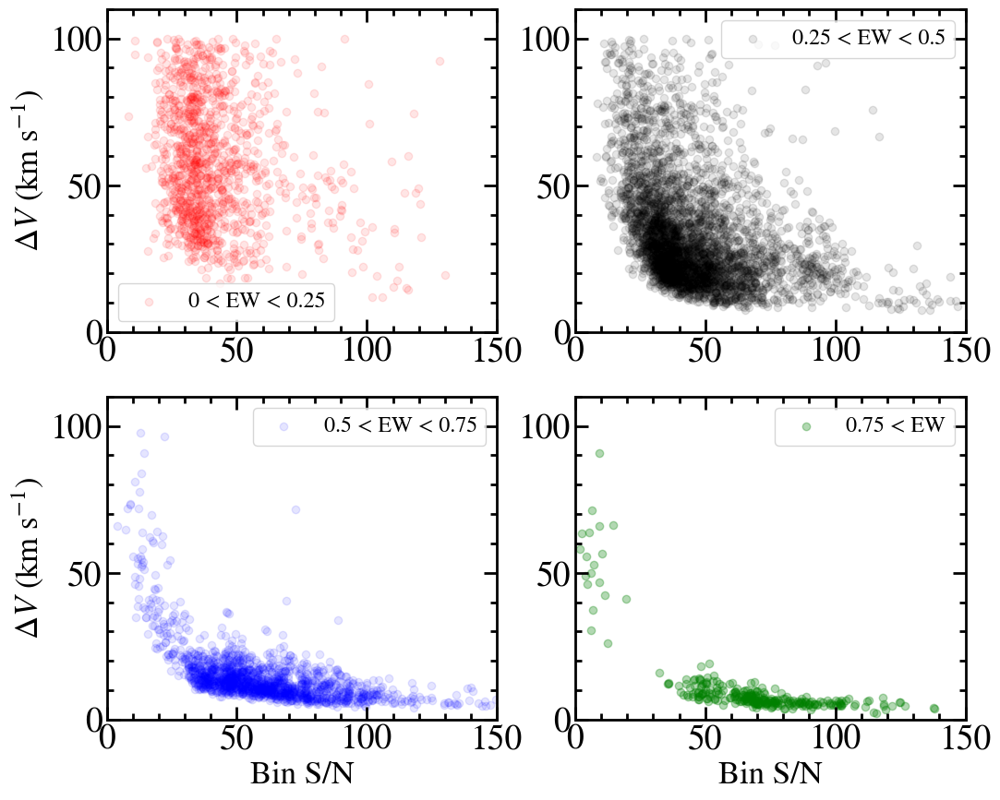

In [91]:
plt.rcParams['figure.figsize'] = (12,10)
fig,((ax1,ax2),
     (ax3,ax4)) =plt.subplots(2,2)

t_ews = [t_ew1,t_ew2,t_ew3,t_ew4]
colors = ['r','k','blue','green']
labels = ['0 < EW < 0.25','0.25 < EW < 0.5','0.5 < EW < 0.75','0.75 < EW']
alpha_val = 0.1
for ax,t_ew,color,label_txt in zip(fig.get_axes(),t_ews,colors,labels):
    
    if label_txt == '0.75 < EW':
        alpha_val = 0.3
        
    ax.scatter(t_ew['sn_bin'],t_ew['vel_widths'],alpha=alpha_val,c=color,label=label_txt) 
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                        length=10,width=2)
    ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                        length=5,width=2)
    ax.set_xlim(0,150)
    ax.set_ylim(0,110)
    ax.legend(fontsize='xx-large')
ax3.set_xlabel('Bin S/N',fontsize=25)
ax4.set_xlabel('Bin S/N',fontsize=25)
ax1.set_ylabel(r'$\Delta V$ (km s$^{-1}$)',fontsize=25)
ax3.set_ylabel(r'$\Delta V$ (km s$^{-1}$)',fontsize=25);

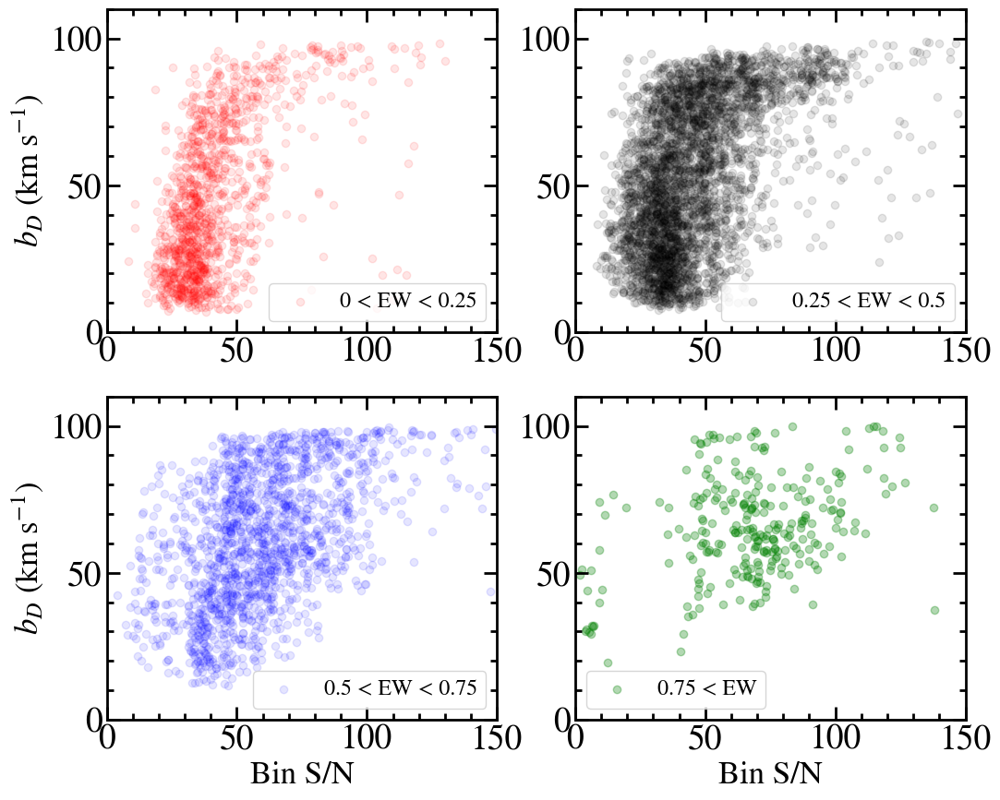

In [92]:
plt.rcParams['figure.figsize'] = (12,10)
fig,((ax1,ax2),
     (ax3,ax4)) =plt.subplots(2,2)

t_ews = [t_ew1,t_ew2,t_ew3,t_ew4]
colors = ['r','k','blue','green']
labels = ['0 < EW < 0.25','0.25 < EW < 0.5','0.5 < EW < 0.75','0.75 < EW']
alpha_val = 0.1
for ax,t_ew,color,label_txt in zip(fig.get_axes(),t_ews,colors,labels):
    
    if label_txt == '0.75 < EW':
        alpha_val = 0.3
        
    ax.scatter(t_ew['sn_bin'],t_ew['b_d'],alpha=alpha_val,c=color,label=label_txt) 
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                        length=10,width=2)
    ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                        length=5,width=2)
    ax.set_xlim(0,150)
    ax.set_ylim(0,110)
    ax.legend(fontsize='xx-large')
ax3.set_xlabel('Bin S/N',fontsize=25)
ax4.set_xlabel('Bin S/N',fontsize=25)
ax1.set_ylabel(r'$b_D$ (km s$^{-1}$)',fontsize=25)
ax3.set_ylabel(r'$b_D$ (km s$^{-1}$)',fontsize=25);

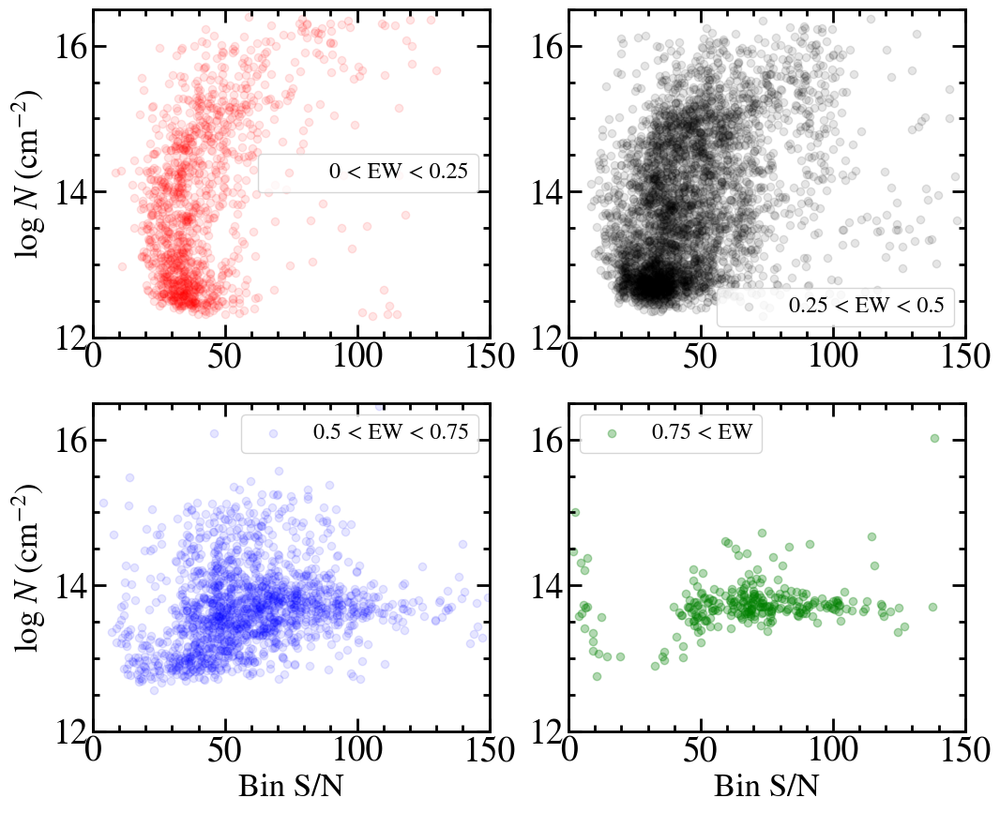

In [93]:
plt.rcParams['figure.figsize'] = (12,10)
fig,((ax1,ax2),
     (ax3,ax4)) =plt.subplots(2,2)

t_ews = [t_ew1,t_ew2,t_ew3,t_ew4]
colors = ['r','k','blue','green']
labels = ['0 < EW < 0.25','0.25 < EW < 0.5','0.5 < EW < 0.75','0.75 < EW']
alpha_val = 0.1
for ax,t_ew,color,label_txt in zip(fig.get_axes(),t_ews,colors,labels):
    
    if label_txt == '0.75 < EW':
        alpha_val = 0.3
        
    ax.scatter(t_ew['sn_bin'],t_ew['logN'],alpha=alpha_val,c=color,label=label_txt) 
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                        length=10,width=2)
    ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                        length=5,width=2)
    ax.set_xlim(0,150)
    ax.set_ylim(12,16.5)
    ax.legend(fontsize='xx-large')
ax3.set_xlabel('Bin S/N',fontsize=25)
ax4.set_xlabel('Bin S/N',fontsize=25)
ax1.set_ylabel(r'log $N$ (cm$^{-2}$)',fontsize=25)
ax3.set_ylabel(r'log $N$ (cm$^{-2}$)',fontsize=25);

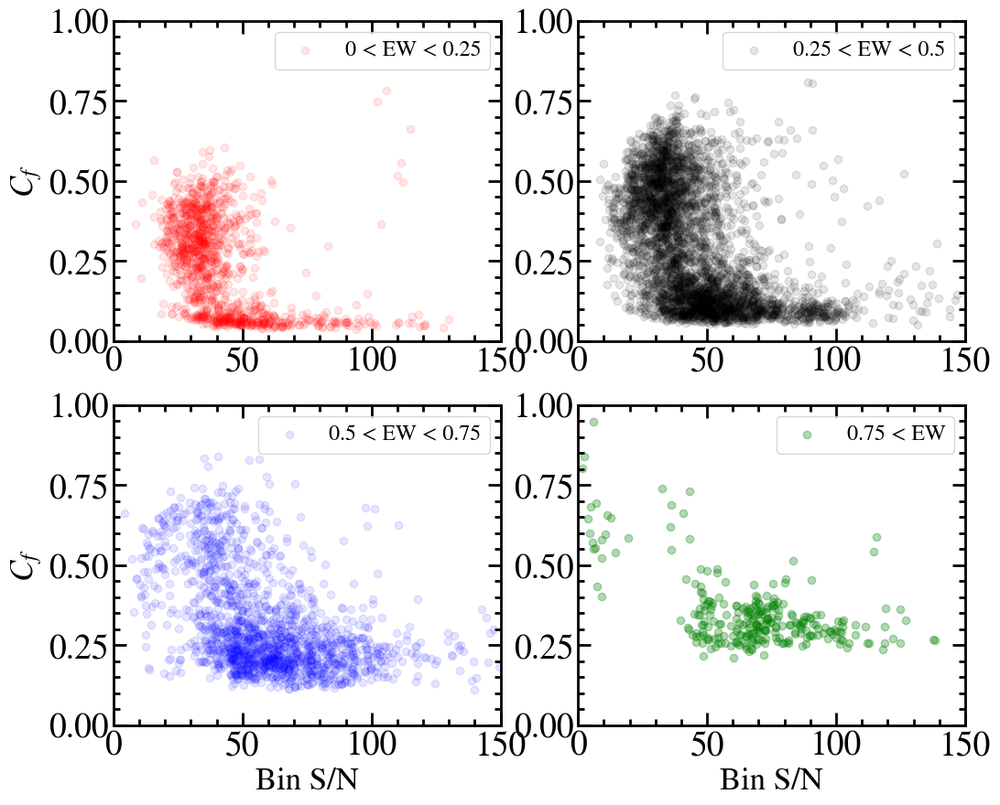

In [94]:
plt.rcParams['figure.figsize'] = (12,10)
fig,((ax1,ax2),
     (ax3,ax4)) =plt.subplots(2,2)

t_ews = [t_ew1,t_ew2,t_ew3,t_ew4]
colors = ['r','k','blue','green']
labels = ['0 < EW < 0.25','0.25 < EW < 0.5','0.5 < EW < 0.75','0.75 < EW']
alpha_val = 0.1
for ax,t_ew,color,label_txt in zip(fig.get_axes(),t_ews,colors,labels):
    
    if label_txt == '0.75 < EW':
        alpha_val = 0.3
        
    ax.scatter(t_ew['sn_bin'],t_ew['C_f'],alpha=alpha_val,c=color,label=label_txt) 
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                        length=10,width=2)
    ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                        length=5,width=2)
    ax.set_xlim(0,150)
    ax.set_ylim(0,1)
    ax.legend(fontsize='xx-large')
ax3.set_xlabel('Bin S/N',fontsize=25)
ax4.set_xlabel('Bin S/N',fontsize=25)
ax1.set_ylabel(r'$C_f$',fontsize=25)
ax3.set_ylabel(r'$C_f$',fontsize=25);

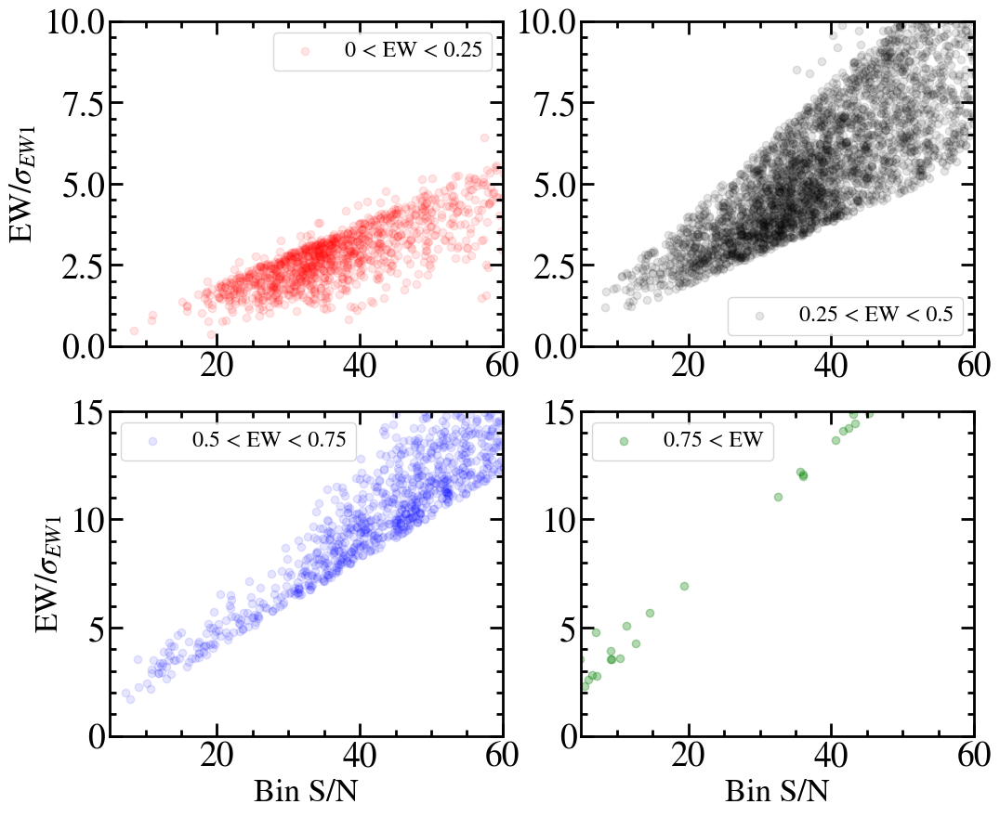

In [134]:
plt.rcParams['figure.figsize'] = (12,10)
fig,((ax1,ax2),
     (ax3,ax4)) =plt.subplots(2,2)

t_ews = [t_ew1,t_ew2,t_ew3,t_ew4]
colors = ['r','k','blue','green']
labels = ['0 < EW < 0.25','0.25 < EW < 0.5','0.5 < EW < 0.75','0.75 < EW']
y_lims = [[0,10],[0,10],[0,15],[0,15]]
alpha_val = 0.1
for ax,t_ew,color,label_txt,y_lim in zip(fig.get_axes(),t_ews,colors,labels,y_lims):
    
    if label_txt == '0.75 < EW':
        alpha_val = 0.3
        
    ax.scatter(t_ew['sn_bin'],t_ew['ews']/t_ew['ews_sig1'],alpha=alpha_val,c=color,label=label_txt) 
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                        length=10,width=2)
    ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                        length=5,width=2)
    ax.set_xlim(5,60)
    ax.set_ylim(y_lim[0],y_lim[1])
    ax.legend(fontsize='xx-large')
ax3.set_xlabel('Bin S/N',fontsize=25)
ax4.set_xlabel('Bin S/N',fontsize=25)
ax1.set_ylabel(r'EW/$\sigma_{EW1}$',fontsize=25)
ax3.set_ylabel(r'EW/$\sigma_{EW1}$',fontsize=25);

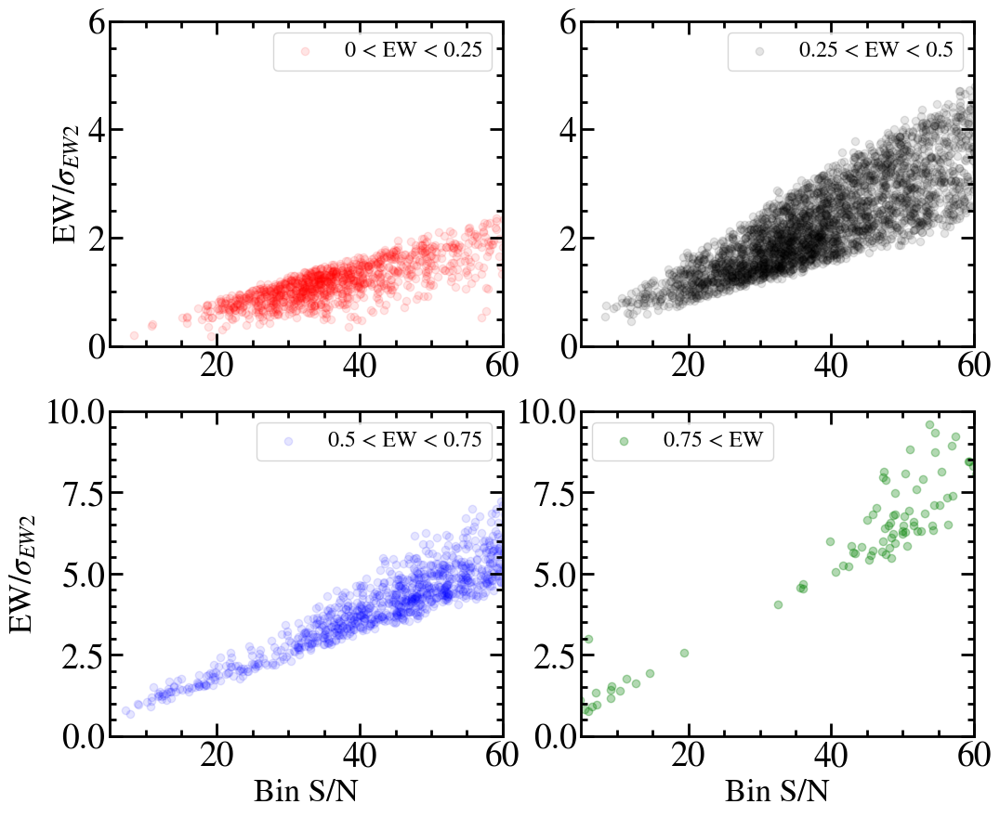

In [135]:
plt.rcParams['figure.figsize'] = (12,10)
fig,((ax1,ax2),
     (ax3,ax4)) =plt.subplots(2,2)

t_ews = [t_ew1,t_ew2,t_ew3,t_ew4]
colors = ['r','k','blue','green']
labels = ['0 < EW < 0.25','0.25 < EW < 0.5','0.5 < EW < 0.75','0.75 < EW']
y_lims = [[0,6],[0,6],[0,10],[0,10]]
alpha_val = 0.1
for ax,t_ew,color,label_txt,y_lim in zip(fig.get_axes(),t_ews,colors,labels,y_lims):
    
    if label_txt == '0.75 < EW':
        alpha_val = 0.3
        
    ax.scatter(t_ew['sn_bin'],t_ew['ews']/t_ew['ews_sig2'],alpha=alpha_val,c=color,label=label_txt) 
    ax.xaxis.set_minor_locator(AutoMinorLocator())
    ax.yaxis.set_minor_locator(AutoMinorLocator())
    ax.tick_params(which = 'major',direction='in',bottom=True, top=True, left=True, right=True,
                        length=10,width=2)
    ax.tick_params(which = 'minor',direction='in',bottom=True, top=True, left=True, right=True,
                        length=5,width=2)
    ax.set_xlim(5,60)
    ax.set_ylim(y_lim[0],y_lim[1])
    ax.legend(fontsize='xx-large')
ax3.set_xlabel('Bin S/N',fontsize=25)
ax4.set_xlabel('Bin S/N',fontsize=25)
ax1.set_ylabel(r'EW/$\sigma_{EW2}$',fontsize=25)
ax3.set_ylabel(r'EW/$\sigma_{EW2}$',fontsize=25);

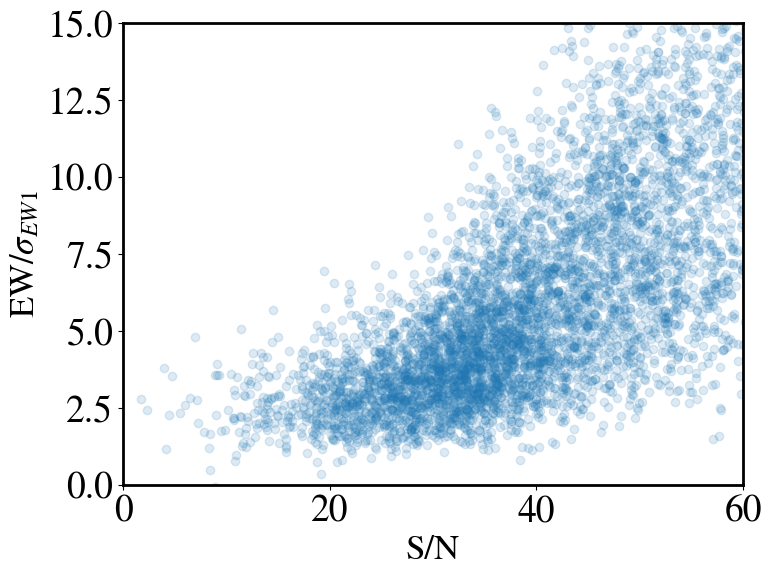

In [108]:
plt.rcParams['figure.figsize'] = (8,6)
plt.scatter(table_compare['sn_bin'],table_compare['ews']/table_compare['ews_sig1'],alpha=0.15)
plt.xlabel('S/N')
plt.ylim(0,15)
plt.xlim(0,60)
#plt.yscale('log')
plt.ylabel(r'EW/$\sigma_{EW1}$'); 

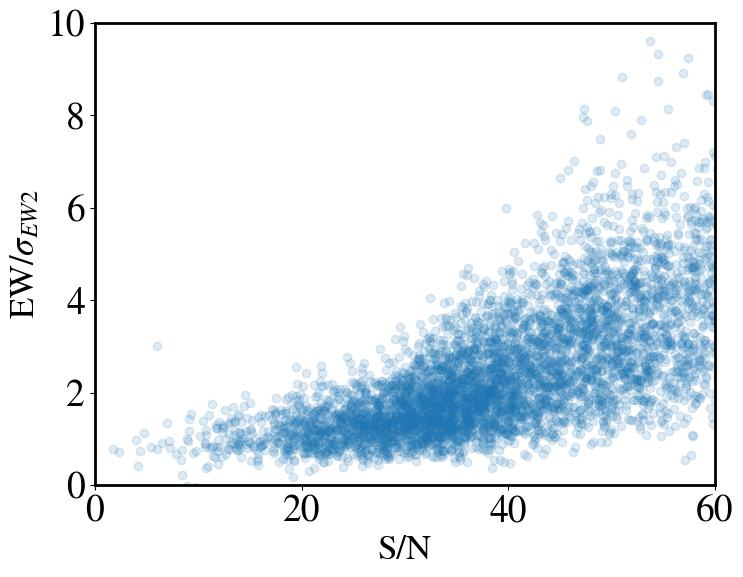

In [109]:
plt.rcParams['figure.figsize'] = (8,6)
plt.scatter(table_compare['sn_bin'],table_compare['ews']/table_compare['ews_sig2'],alpha=0.15)
plt.xlabel('S/N')
plt.ylim(0,10)
plt.xlim(0,60)
#plt.yscale('log')
plt.ylabel(r'EW/$\sigma_{EW2}$'); 

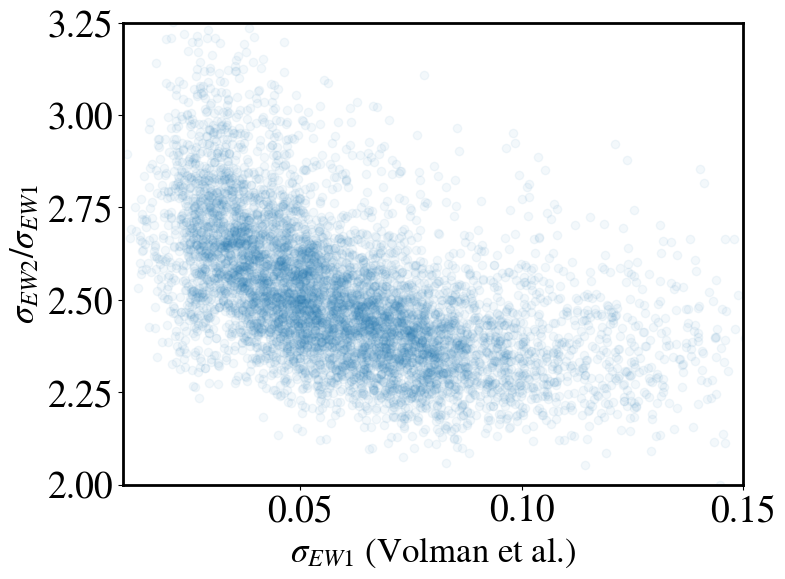

In [116]:
plt.rcParams['figure.figsize'] = (8,6)
plt.scatter(table_compare['ews_sig1'],table_compare['ews_sig2']/table_compare['ews_sig1'],alpha=0.05)
plt.xlabel('S/N')
plt.xlim(1e-2,1.5e-1)
plt.ylim(2,3.25)
# plt.xlim(10,40)
#plt.xscale('log')
#plt.yscale('log')
plt.xlabel(r'$\sigma_{EW1}$ (Volman et al.)'); 
plt.ylabel(r'$\sigma_{EW2}$/$\sigma_{EW1}$'); 

In [21]:
print(pos_t_300_400['bin'].size)
print(pos_t_200_300['bin'].siz
print(pos_t_150_200['bin'].size)

28
28
87


In [22]:
print(neg_t_300_400['bin'].size)
print(neg_t_200_300['bin'].size)
print(neg_t_150_200['bin'].size)

21
26
39


In [95]:
# seperate positive and negative velocities
pos_t = table_uniq[table_uniq['velocities'] > 0]
neg_t = table_uniq[table_uniq['velocities'] < 0]

pos_t_300_400 = pos_t[(pos_t['velocities']>300) & (pos_t['velocities']<400) ]
pos_t_200_300 = pos_t[(pos_t['velocities']>200) & (pos_t['velocities']<300) ]
pos_t_150_200 = pos_t[(pos_t['velocities']>150) & (pos_t['velocities']<200) ]

neg_t_300_400 = neg_t[(neg_t['velocities']<-300) & (neg_t['velocities']>-400) ]
neg_t_200_300 = neg_t[(neg_t['velocities']<-200) & (neg_t['velocities']>-300) ]
neg_t_150_200 = neg_t[(neg_t['velocities']<-150) & (neg_t['velocities']>-200) ]

In [98]:
#binid_range = pos_t_300_400['bin'][:25]
file_name = 'NaI_spec_EW0-0.1/bin0-16'
mkplots(table_uniq,t_ew1['bin_id'],redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

NameError: name 't_ew0' is not defined

/Users/erickaguirre/miniconda3/lib/python3.10/site-packages/numpy/core/fromnumeric.py:758: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
/Users/erickaguirre/packages/linetools/linetools/spectra/xspectrum1d.py:107: UserWarning: Assuming wavelength unit is Angstroms
  warnings.warn("Assuming wavelength unit is Angstroms")


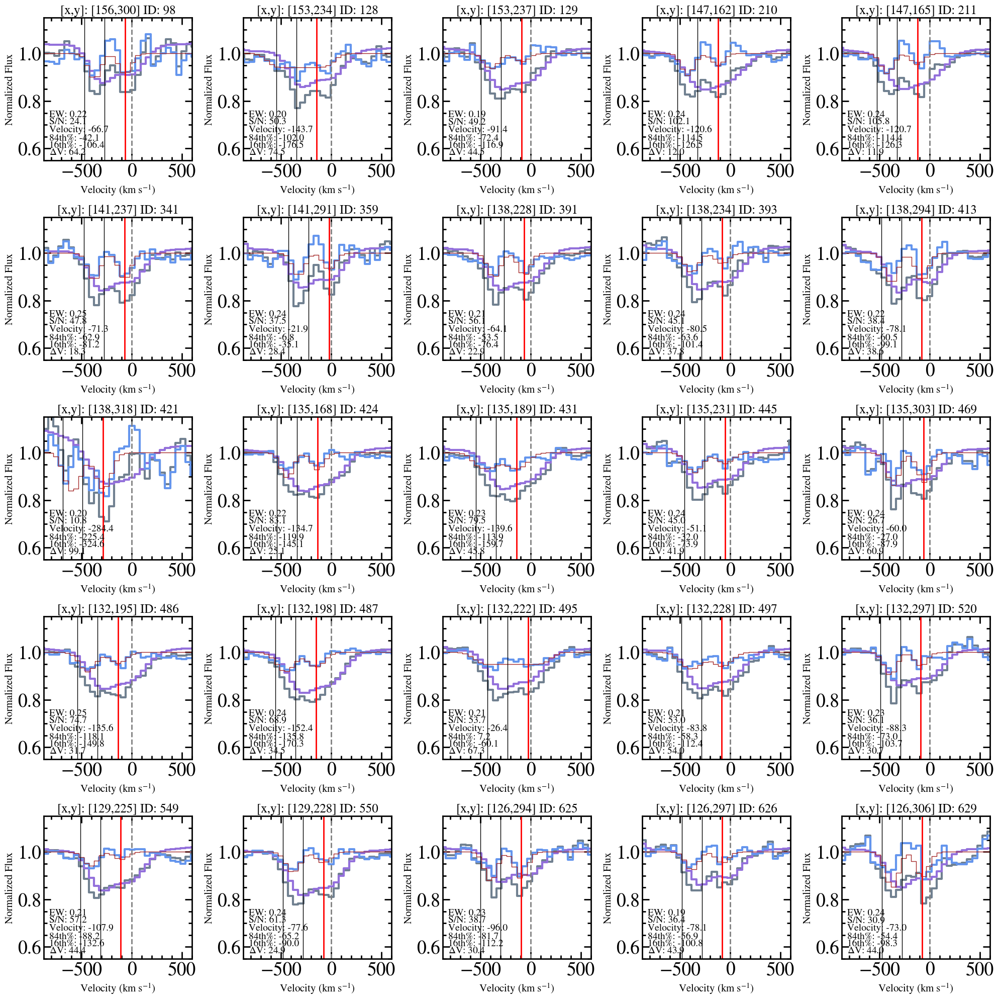

In [111]:
file_name = 'NaI_spec_EW0.1-0.25/bin0-25'
mkplots(table_uniq,t_ew1['bin_id'][:25],redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

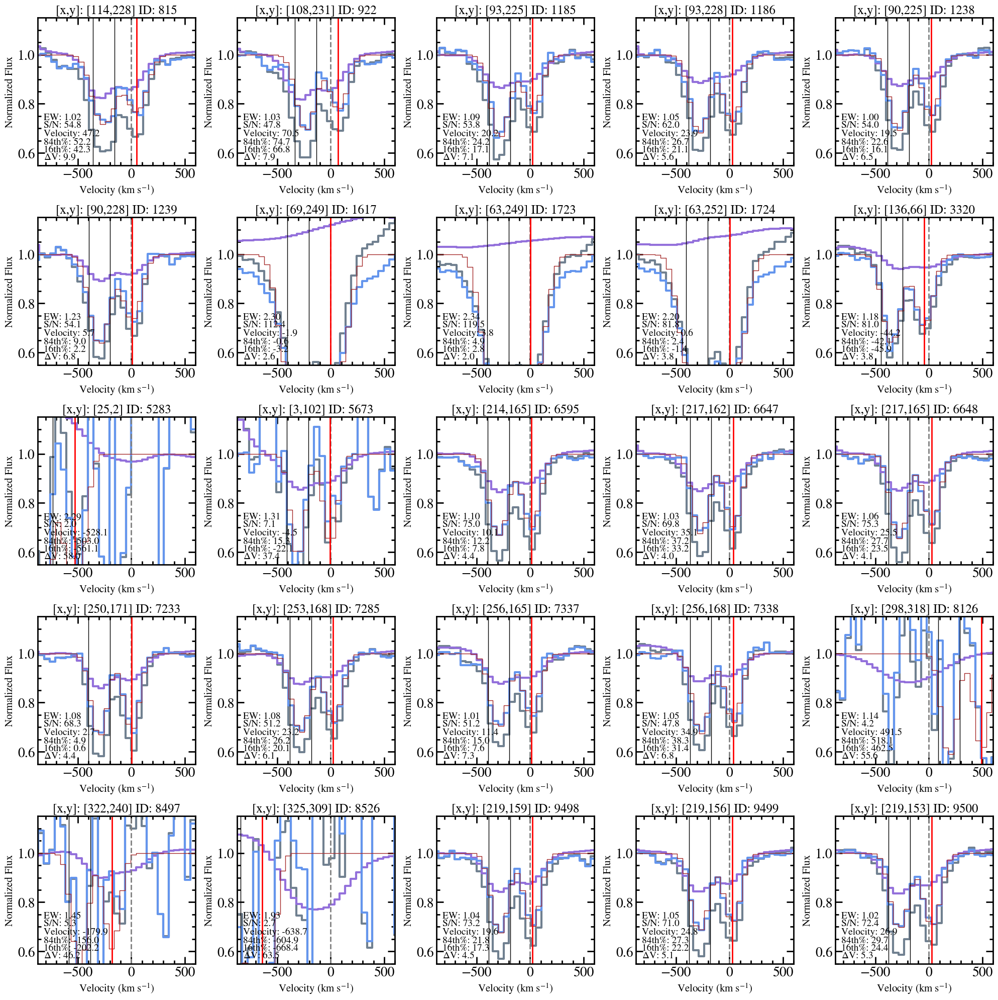

In [59]:
file_name = 'NaI_spec_EW_greater1/bin0-25'
mkplots(table_uniq,t_ew4['bin_id'][:25],redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

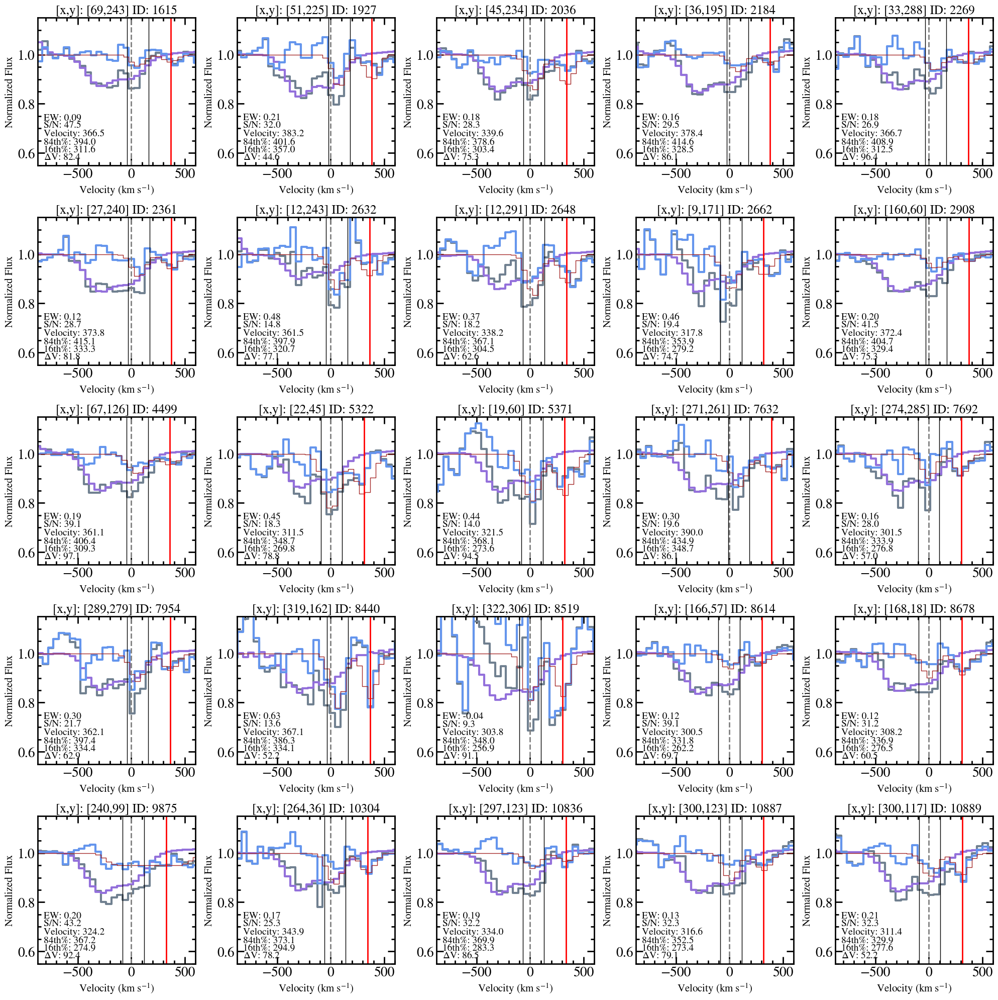

In [46]:
binid_range = pos_t_300_400['bin'][:25]
file_name = 'NaI_spec_300-400kms/pos_300-400kms_bin0-25'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

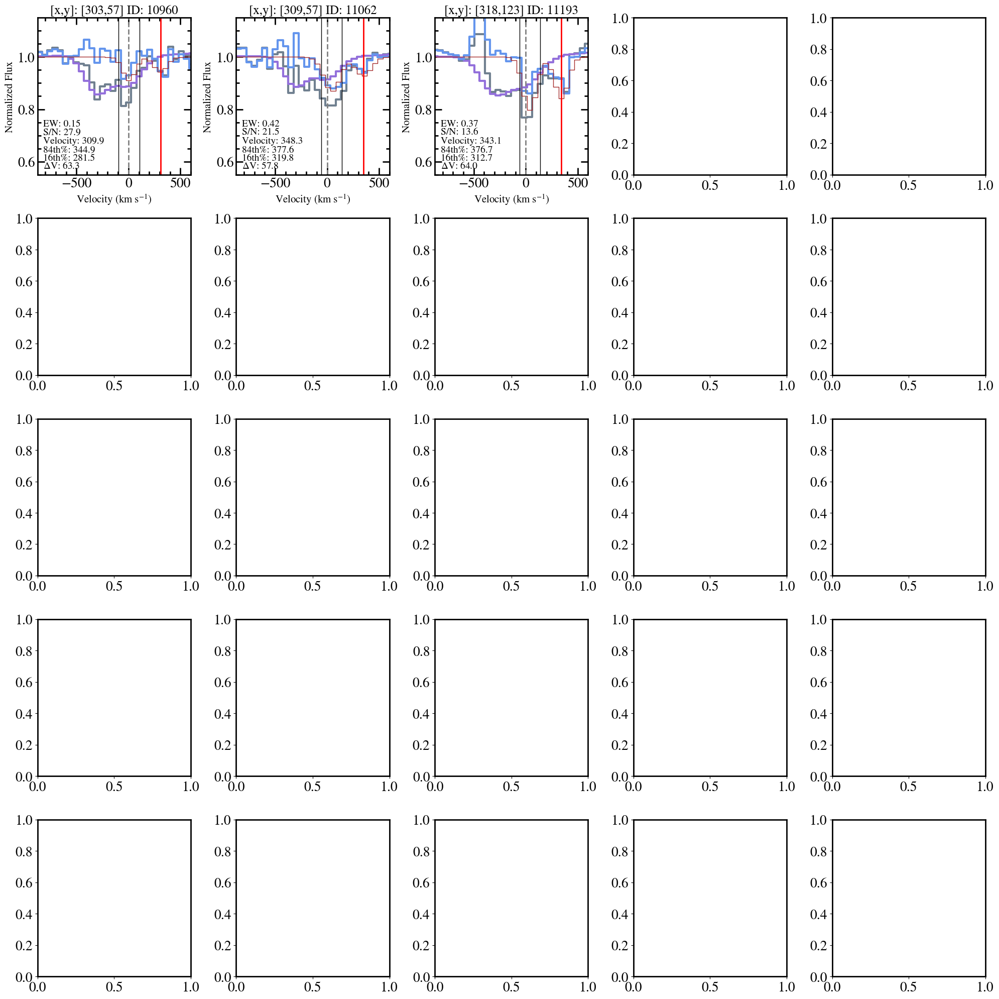

In [45]:
binid_range = pos_t_300_400['bin'][25:28]
file_name = 'NaI_spec_300-400kms/pos_300-400kms_bin25-28'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

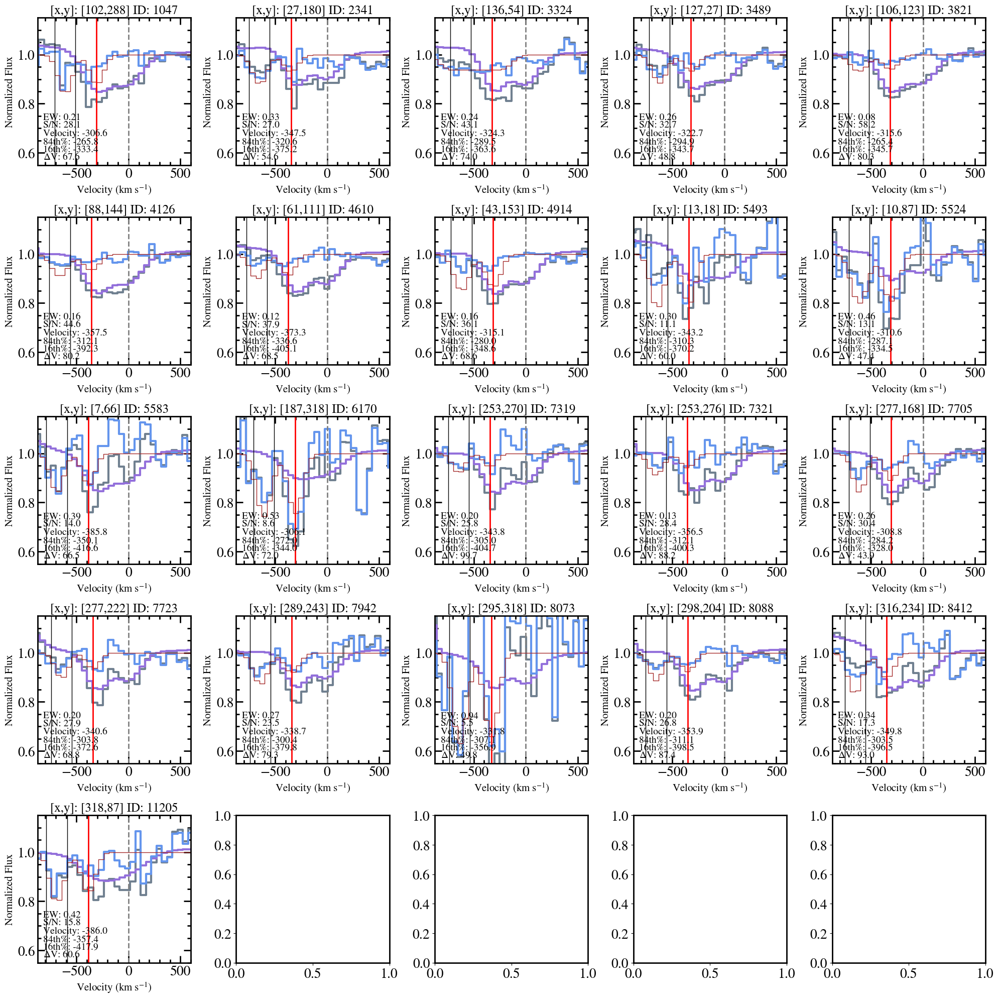

In [47]:
binid_range = neg_t_300_400['bin'][:25]
file_name = 'NaI_spec_300-400kms/neg_300-400kms_bin0-20'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

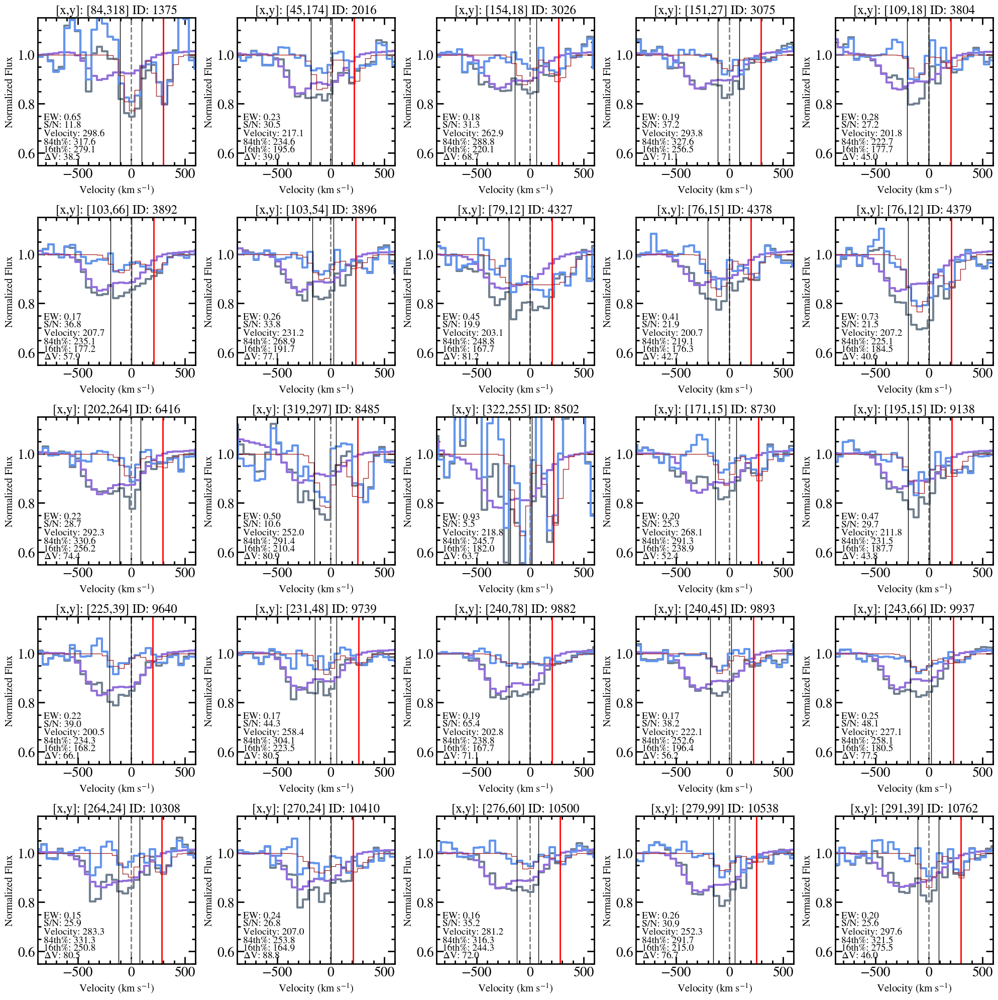

In [48]:
binid_range = pos_t_200_300['bin'][:25]
file_name = 'NaI_spec_200-300kms/pos_200-300kms_bin0-24'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

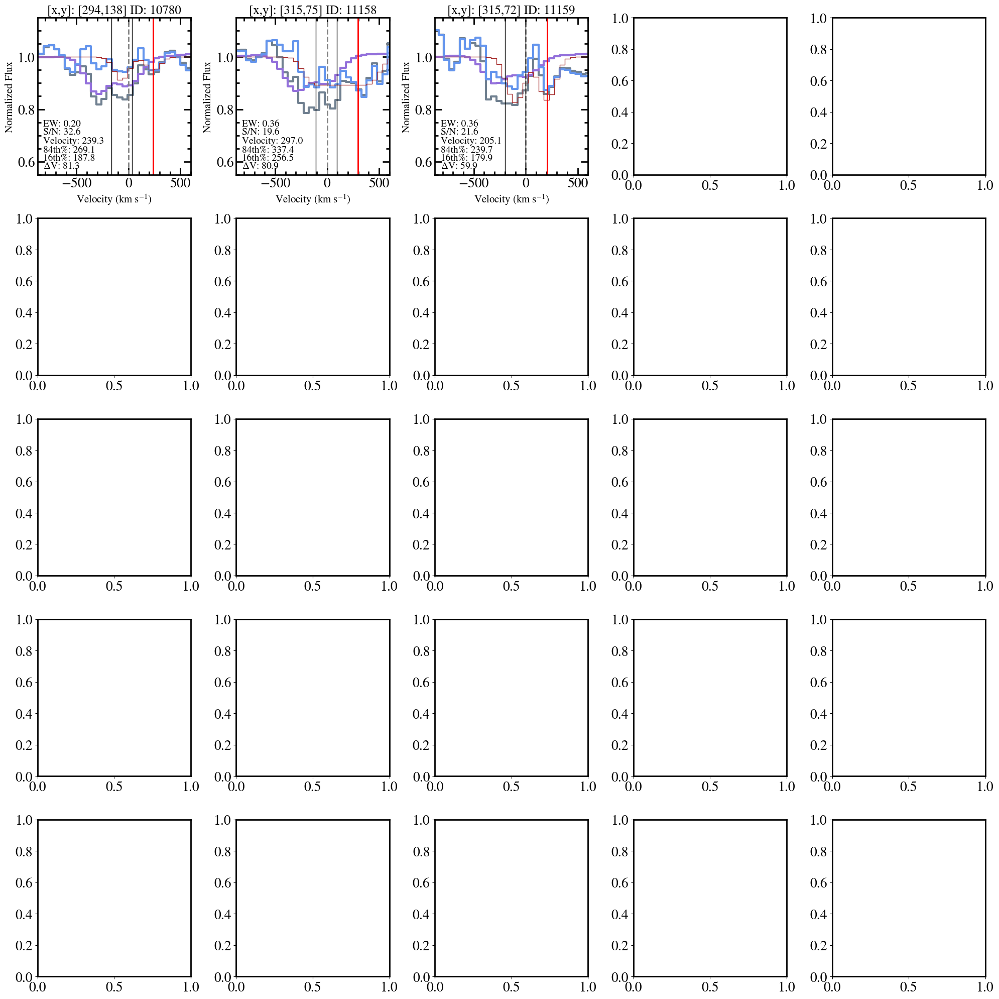

In [49]:
binid_range = pos_t_200_300['bin'][25:28]
file_name = 'NaI_spec_200-300kms/pos_200-300kms_bin25-27'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

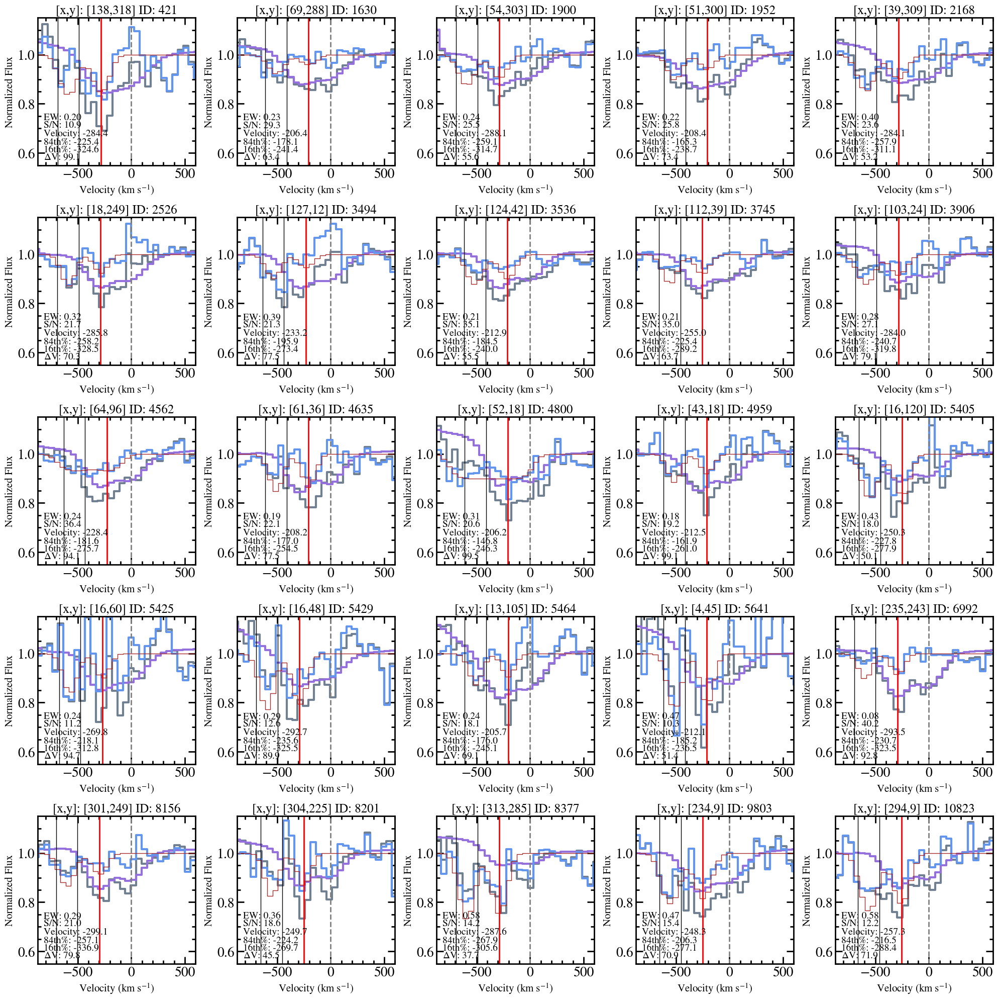

In [50]:
binid_range = neg_t_200_300['bin'][:25]
file_name = 'NaI_spec_200-300kms/neg_200-300kms_bin0-24'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

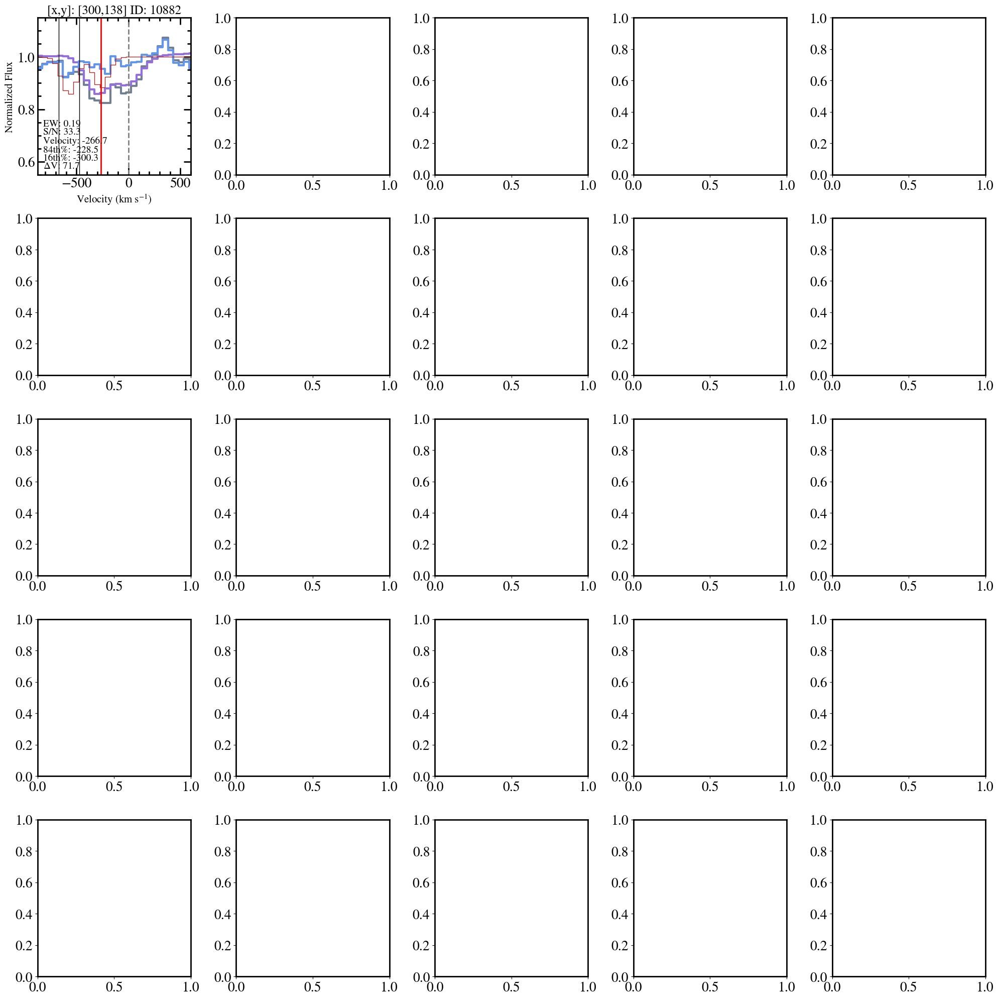

In [52]:
binid_range = neg_t_200_300['bin'][25:]
file_name = 'NaI_spec_200-300kms/neg_200-300kms_bin25'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

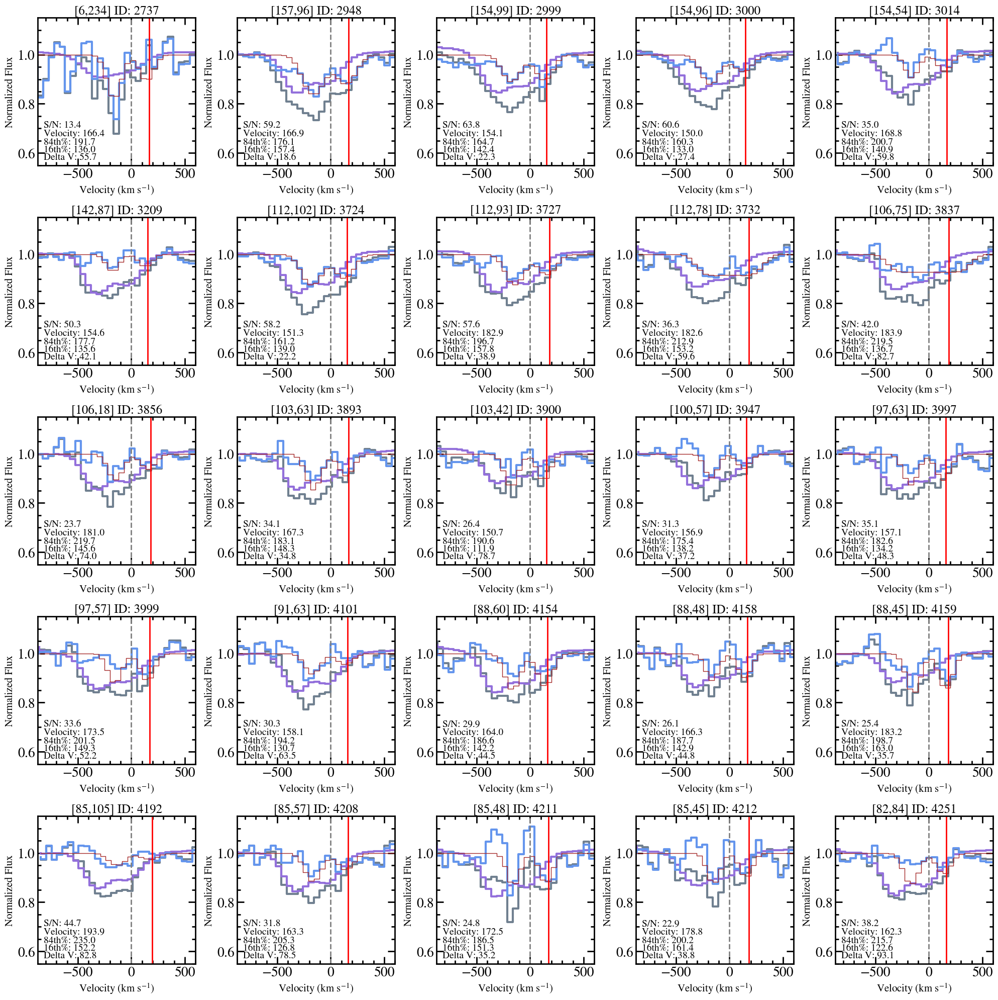

In [55]:
binid_range = pos_t_150_200['bin'][:25]
file_name = 'NaI_spec_150-200kms/pos_150-200kms_bin0-24'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

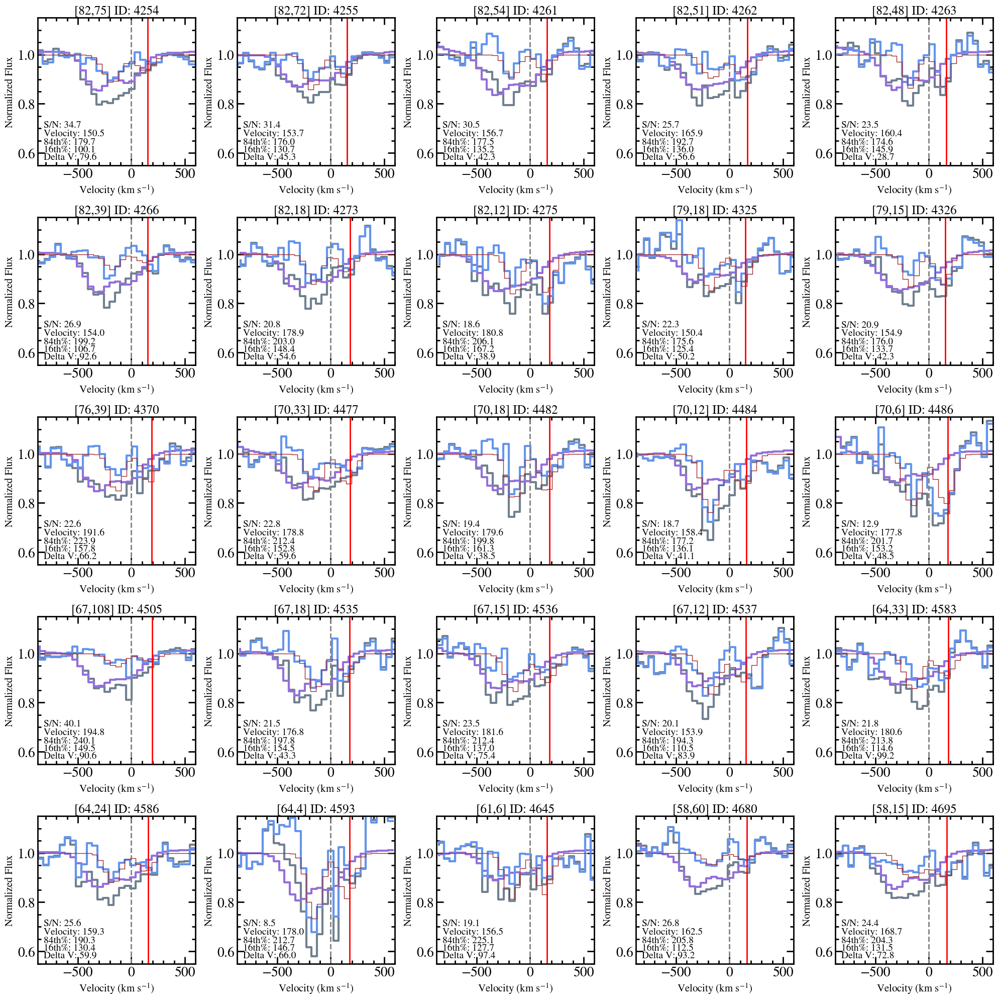

In [56]:
binid_range = pos_t_150_200['bin'][25:50]
file_name = 'NaI_spec_150-200kms/pos_150-200kms_bin25-49'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

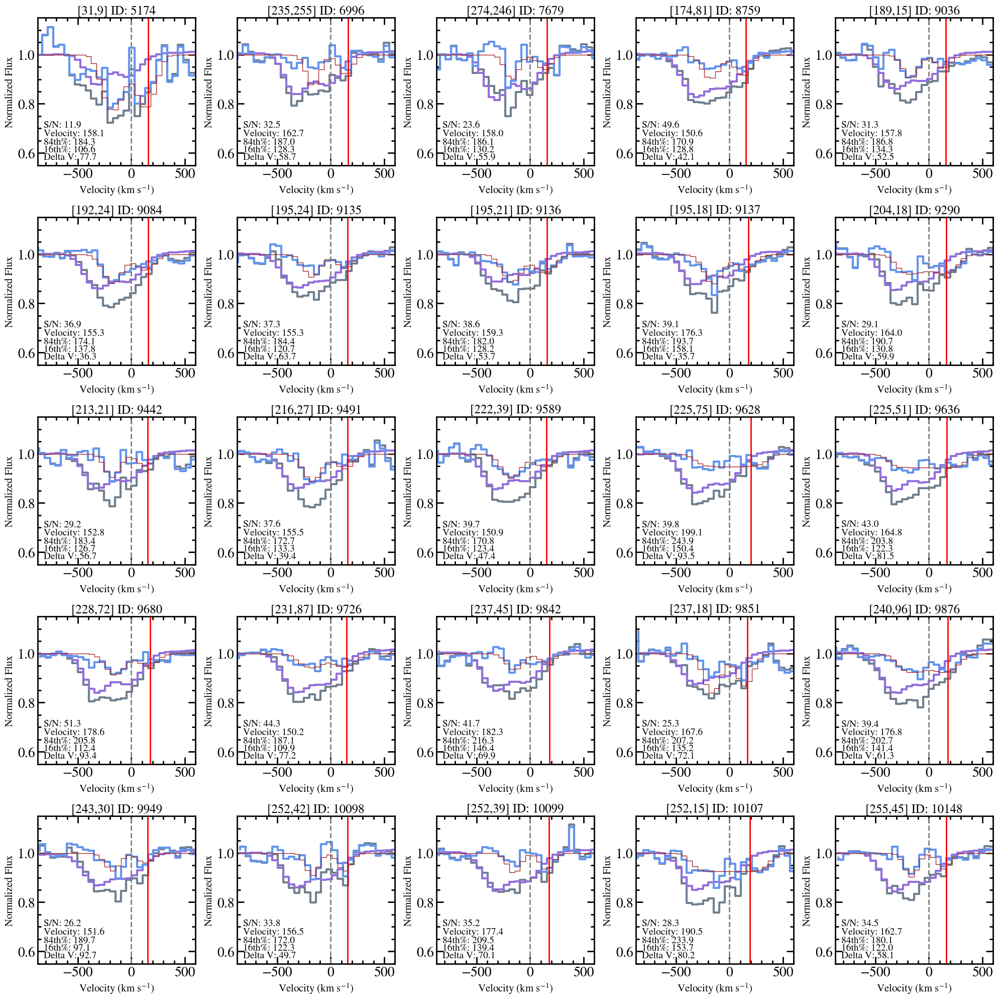

In [57]:
binid_range = pos_t_150_200['bin'][50:75]
file_name = 'NaI_spec_150-200kms/pos_150-200kms_bin50-74'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

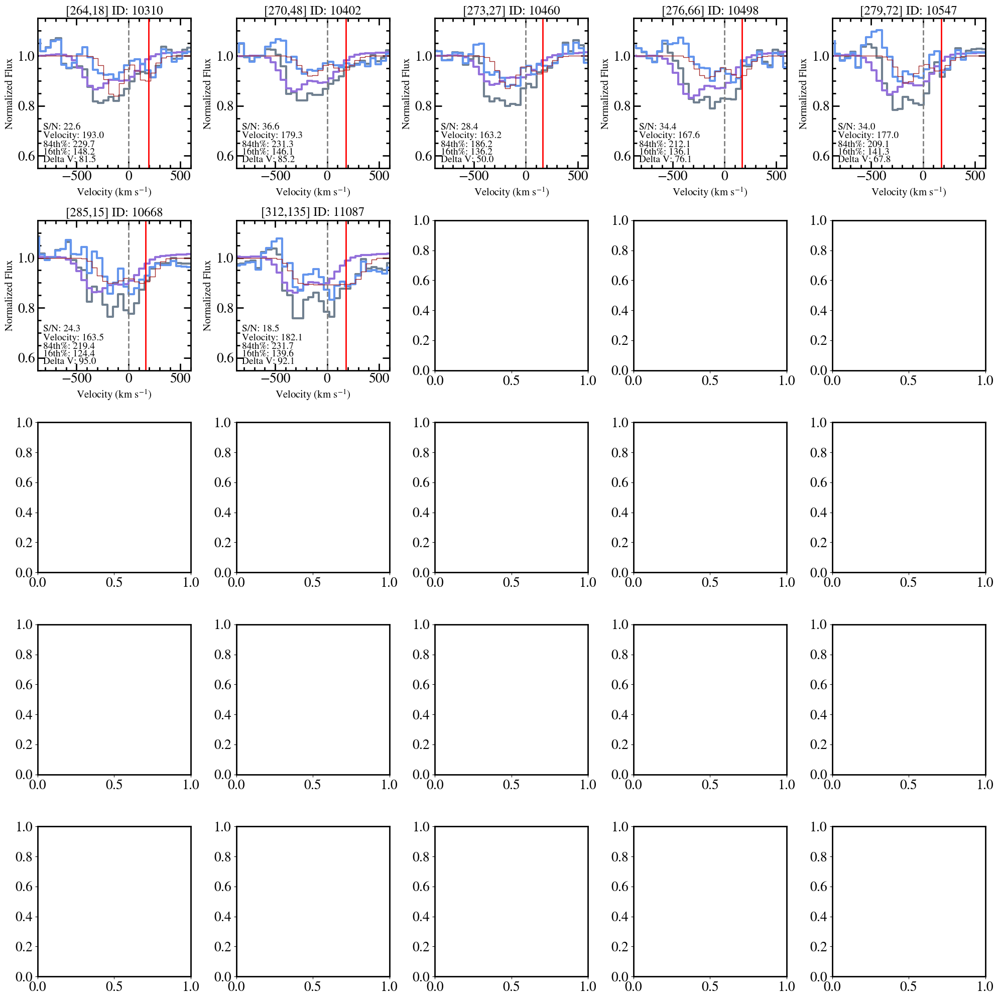

In [59]:
binid_range = pos_t_150_200['bin'][75:100]
file_name = 'NaI_spec_150-200kms/pos_150-200kms_bin75-81'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

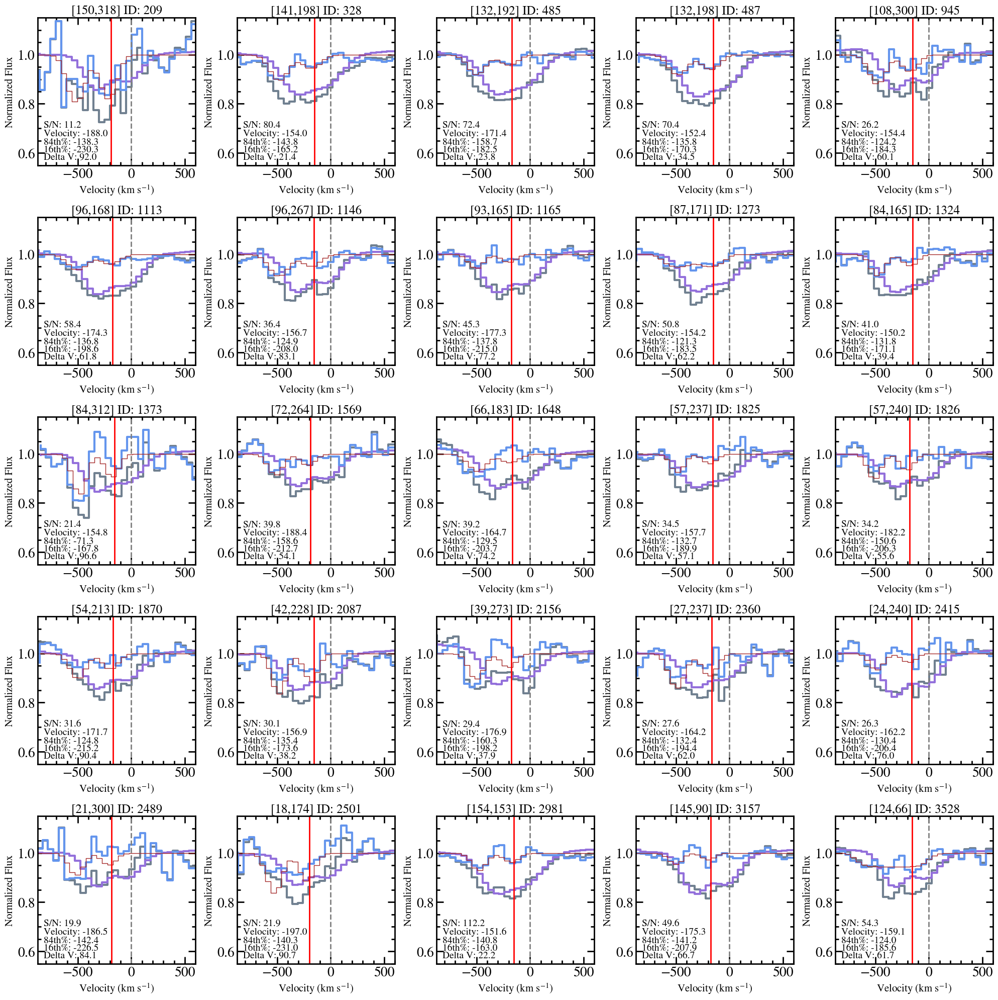

In [60]:
binid_range = neg_t_150_200['bin'][:25]
file_name = 'NaI_spec_150-200kms/neg_150-200kms_bin0-24'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

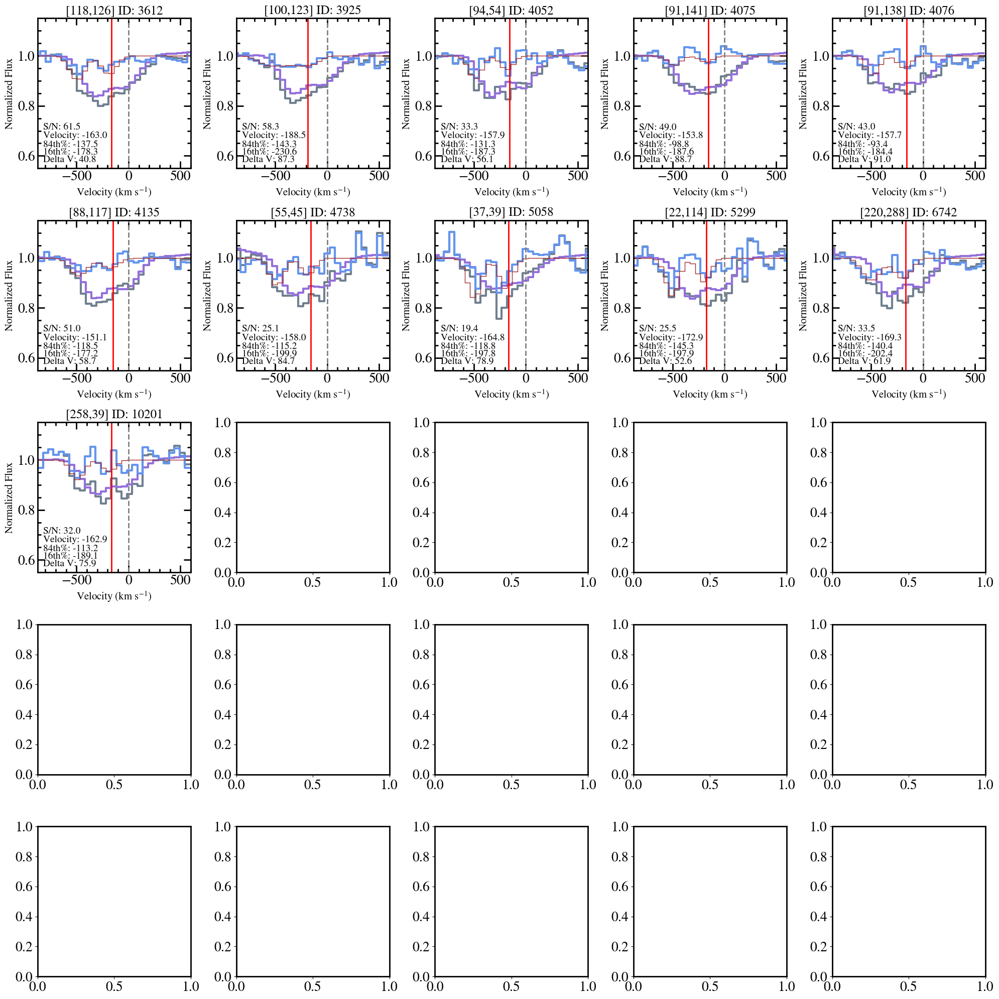

In [61]:
binid_range = neg_t_150_200['bin'][25:50]
file_name = 'NaI_spec_150-200kms/neg_150-200kms_bin25-35'
mkplots(table_uniq,binid_range,redshift,binid_map,
        stellar_vel,flux,model,error, wave,LSFvel,vel_widths_filt,file_name)

In [10]:
path = '/Users/erickaguirre/Desktop/NaI_MCMC_output/NGC4030_0.6_err_corr/'
file = 'NGC4030_NOISM_err_corr-binid-0-250-samples-run0.fits'
file = fits.open(path+file)
#file[1].data[0]
table_mcmc = Table(file[1].data)

In [94]:
import arviz as az
def corner_plot(table_mcmc,binid):
    plt.rcParams['font.family'] = 'stixgeneral'
    plt.rcParams['mathtext.fontset'] = 'stix'
    plt.rcParams['figure.figsize'] = (8,8)
    # speed of light in km/s
    c = 2.998e5
    # Na I doublet vacuum absorption wavelengths 
    D2 = 5891.582 # in angstroms
    D1 = 5897.558 # in angstroms

    # emcee parameters
    ndim = 4
    burnin = 1000
    binid=16

    bin_sampler = table_mcmc['samples'][table_mcmc['bin']==binid][0]
    bin_samples = bin_sampler[:, burnin:, :].reshape((-1, ndim))
    bin_samples[:,0] = ( (bin_samples[:,0]/D1) - 1) * c
    plt.rcParams['figure.figsize'] = (4,4)
    figure = corner.corner(bin_samples,quantiles=[0.16, 0.5, 0.84],
                              labels=[
        "Velocity" + '\n' + r"(km s$^{-1}$)",
        "$N$" + '\n' + r"(cm$^{-2}$)",
        r"$b_D$" + '\n' +r"(km s$^{-1}$)",
        r"$C_f$"],max_n_ticks=3,smooth=0.5,fill_contours=True,
        label_kwargs=dict(fontsize=30),labelpad=-0.01)

    # for control of labelsize of x,y-ticks:
    for ax in figure.get_axes(): 
            ax.tick_params(axis='both', labelsize=25,rotation=0)

    # get the 50th percentile from each parameter
    samples_50th = np.quantile(bin_samples, 0.50,axis=0)
    # reshape the axes using the number of parameters
    axes = np.array(figure.axes).reshape((ndim, ndim))

    # show the 50th percentile in red for each 1d histogram
    for i in range(ndim):
        ax = axes[i, i]
        ax.axvline(samples_50th[i], color="r")

    # Loop over the 2D histograms to show the 50th percentile
    for yi in range(ndim):
        for xi in range(yi):
            ax = axes[yi, xi]
            ax.scatter(samples_50th[xi], samples_50th[yi], color="red",marker='+',s=150,zorder=11)
    figure.savefig('/Users/erickaguirre/Desktop/paper_plots/0.6_err_corr_plots/MCMC_corner_plot.pdf',
                  bbox_inches='tight')

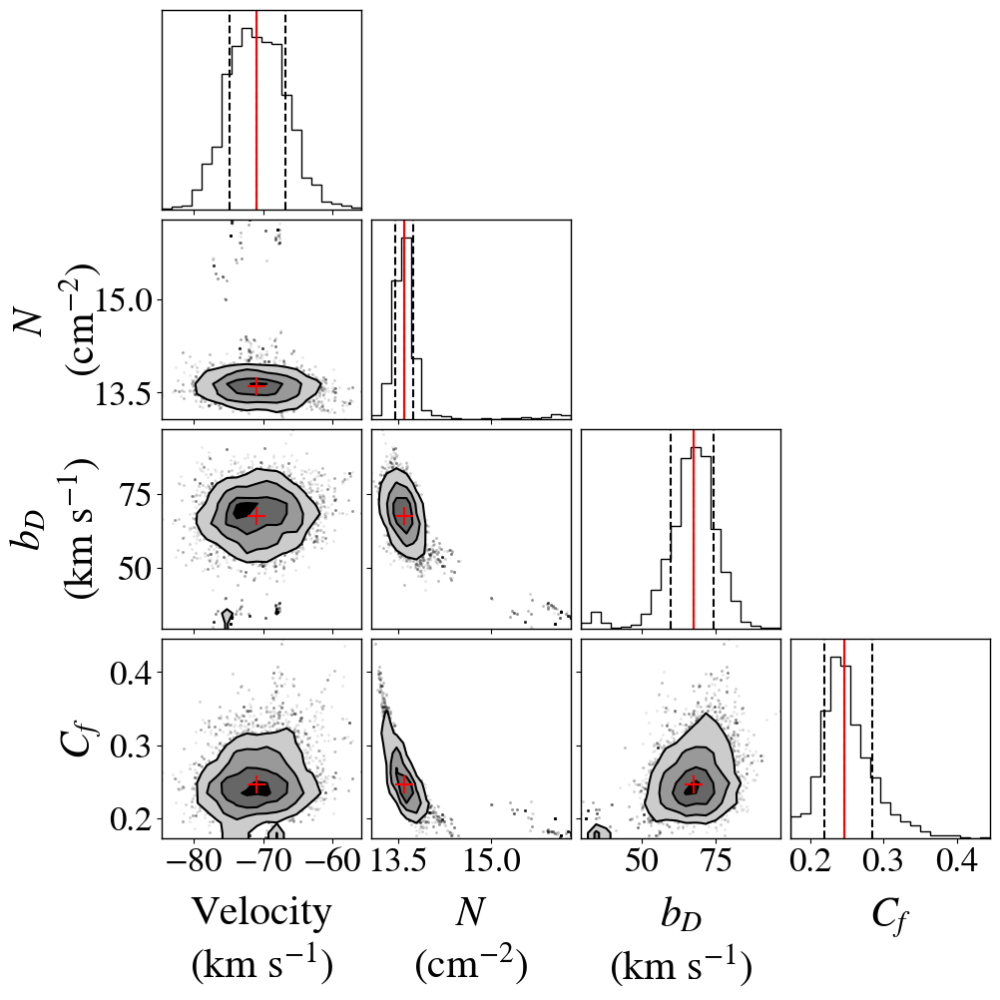

In [95]:
corner_plot(table_mcmc,binid=16)